# Re-curating iModulons after re-running analysis for TPM mapping (2022-10-31) to updated genome from 2022-04-11

In [1]:
from pymodulon.io import *
from pymodulon.plotting import *
from os import path
import altair as alt

In [2]:
data_dir = path.join('..','data','5g_processed_data')
#interim_dir = path.join('..','data','5g_interim')

In [3]:
#ica_data = load_json_model(path.join(data_dir,'5g_raw.json.gz'))
ica_data = load_json_model(path.join(data_dir,'5g_raw_20221031.json.gz'))

In [4]:
#DF_enrichments = pd.read_csv(path.join(data_dir,'5G_functional_enrichments.csv'),index_col=0)
DF_enrichments = pd.read_csv(path.join(data_dir,'5G_functional_enrichments_20221031.csv'),index_col=0)

In [5]:
ica_data.X.shape

(4180, 90)

In [112]:
sample2cond = dict(ica_data.sample_table.reset_index()[['index','exp_condition']].values)

In [125]:
act_df = ica_data.A.reset_index().melt(id_vars='index',var_name='sample_id')
act_df['exp_condition'] = act_df['sample_id'].apply(lambda x: sample2cond[x])
act_df = act_df.rename(columns={'index':'imod'})
act_df

,imod,sample_id,value,exp_condition
0,0,5GB1_FM03_TR1_QC_tpm,9.219409,uMax
1,1,5GB1_FM03_TR1_QC_tpm,0.595820,uMax
2,SG_1,5GB1_FM03_TR1_QC_tpm,-0.615273,uMax
3,3,5GB1_FM03_TR1_QC_tpm,-0.248316,uMax
4,4,5GB1_FM03_TR1_QC_tpm,-0.278089,uMax
...,...,...,...,...
3865,38,5GB1C_CH4_1000ppm-Rep2_tpm,-2.795177,CH4_1000ppm
3866,SG_9,5GB1C_CH4_1000ppm-Rep2_tpm,0.150109,CH4_1000ppm
3867,40,5GB1C_CH4_1000ppm-Rep2_tpm,2.359294,CH4_1000ppm
3868,SG_10,5GB1C_CH4_1000ppm-Rep2_tpm,-5.381854,CH4_1000ppm


# Add iModulon category

In [6]:
for i,row in ica_data.imodulon_table.iterrows():
    # if pd.notnull(row.regulator):
    #     ica_data.imodulon_table.loc[i, 'category'] = 'regulatory'
    if pd.notnull(row.single_gene):
        ica_data.imodulon_table.loc[i, 'category'] = 'single_gene'
    else:
        ica_data.imodulon_table.loc[i, 'category'] = 'uncharacterized'

In [7]:
ica_data.imodulon_table.head(15)

,single_gene,imodulon_size,explained_variance,category
0,NaN,91,0.014136,uncharacterized
1,NaN,41,0.005137,uncharacterized
SG_1,True,62,0.003533,single_gene
3,NaN,178,0.013264,uncharacterized
4,NaN,9,0.057266,uncharacterized
5,NaN,223,0.052252,uncharacterized
6,NaN,99,0.059165,uncharacterized
7,NaN,8,0.004512,uncharacterized
8,NaN,20,0.062186,uncharacterized
SG_2,True,1,0.006651,single_gene


# Inspect all iModulons without an automated annotation

In [8]:
unchar_imods = ica_data.imodulon_table[ica_data.imodulon_table.category == 'uncharacterized']

In [9]:
unchar_imods

,single_gene,imodulon_size,explained_variance,category
0,NaN,91,0.014136,uncharacterized
1,NaN,41,0.005137,uncharacterized
3,NaN,178,0.013264,uncharacterized
4,NaN,9,0.057266,uncharacterized
5,NaN,223,0.052252,uncharacterized
6,NaN,99,0.059165,uncharacterized
7,NaN,8,0.004512,uncharacterized
8,NaN,20,0.062186,uncharacterized
10,NaN,142,0.029949,uncharacterized
11,NaN,6,0.022017,uncharacterized


### iModulon 0: 

In [10]:
ica_data.view_imodulon(0)

,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
EQU24_RS00390,0.053503,NaN,83141,83930,1,glycosyltransferase family 4 protein,M,Cell wall/membrane/envelope biogenesis,45,EQU24_RS00390,WP_017841409.1,||None,phospho-N-acetylmuramoyl-pentapeptide-transfer...,['phospho-N-acetylmuramoyl-pentapeptide-transf...
EQU24_RS00450,0.046464,NaN,95639,95957,1,phosphoribosyl-ATP diphosphatase,E,Amino acid transport and metabolism,51,EQU24_RS00450 // hisI // hisF // hisA // hisH ...,WP_017841397.1,||None,phosphoribosyl-ATP diphosphatase activity\ncar...,['phosphoribosyl-ATP diphosphatase activity'\n...
EQU24_RS00495,0.063648,plsY,102221,102797,1,glycerol-3-phosphate 1-O-acyltransferase PlsY,I,Lipid transport and metabolism,57,plsY,WP_201764901.1,plsY||plsY,acyl-phosphate glycerol-3-phosphate acyltransf...,['acyl-phosphate glycerol-3-phosphate acyltran...
EQU24_RS00600,0.059031,NaN,124502,124934,1,DedA family protein,S,Function unknown,72,EQU24_RS00600,WP_017841369.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS00660,0.061823,NaN,137803,138718,1,MlaD family protein,Q,"Secondary metabolites biosynthesis, transport,...",77,EQU24_RS00665 // EQU24_RS00660 // EQU24_RS0065...,WP_026130246.1,||None,integral component of membrane,['integral component of membrane']
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EQU24_RS22530,0.071379,NaN,3901146,3901290,-1,hypothetical protein,X,No COG annotation,1962,EQU24_RS17460 // EQU24_RS22535 // EQU24_RS1745...,WP_017842337.1,||None,NaN,[]
EQU24_RS22555,-0.050132,NaN,3971993,3972143,1,hypothetical protein,X,No COG annotation,1992,EQU24_RS22555 // EQU24_RS17785,WP_017842273.1,||None,NaN,[]
EQU24_RS22780,0.046196,NaN,4103004,4103181,-1,hypothetical protein,L,"Replication, recombination and repair",2557,EQU24_RS22780,WP_201764873.1,||None,NaN,[]
EQU24_RS22845,0.063815,NaN,218731,219004,1,hypothetical protein,L,"Replication, recombination and repair",2562,EQU24_RS22845,WP_244310897.1,||None,NaN,[]


<AxesSubplot:ylabel='0 iModulon\nActivity'>

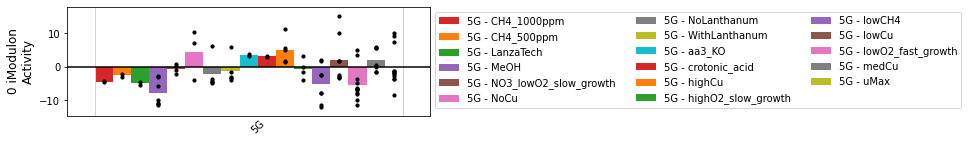

In [18]:
plot_activities(ica_data,0,highlight=['5G'])

# Erin's replotting attempt

In [19]:
def plot_activities_erin(
    ica_data, imodulon, assigned_colors=None, ax=None, legend_kwargs=None
):
    """
    Creates a barplot showing an iModulon's activity across the compendium
    Parameters
    ----------
    ica_data: ~pymodulon.core.IcaData
        :class:`~pymodulon.core.IcaData` object
    imodulon: int or str
        `iModulon` name
    projects: list or str, optional
        Name(s) of `projects` to show (default: show all)
    highlight: str or list, optional
        Name(s) of projects to `highlight` (default: None)
    ax: ~matplotlib.axes.Axes, optional
        Axes object to plot on, otherwise use current Axes
    legend_kwargs: dict, optional
        Additional keyword arguments passed to :func:`matplotlib.pyplot.legend`
    Returns
    -------
    ax: ~matplotlib.axes.Axes
        :class:`~matplotlib.axes.Axes` containing the barplot
    """

    # Check that iModulon exists
    if imodulon in ica_data.A.index:
        values = ica_data.A.loc[imodulon]
    else:
        raise ValueError(f"iModulon does not exist: {imodulon}")

    label = "{} iModulon\nActivity".format(imodulon)

    return barplot_erin(
        values=values,
        sample_table=ica_data.sample_table,
        ylabel=label,
        # projects=projects,
        # highlight=highlight,
        assigned_colors=assigned_colors,
        ax=ax,
        legend_kwargs=legend_kwargs,
    )


In [35]:
def barplot_erin(
    values,
    sample_table,
    ylabel="",
    #projects=None,
    #highlight=None,
    assigned_colors=None,
    ax=None,
    legend_kwargs=None,
):
    """
    Creates an overlaid scatter and barplot for a set of values (either gene
    expression levels or iModulon activities)
    Parameters
    ----------
    values: ~pandas.Series
        List of `values` to plot
    sample_table: ~pandas.DataFrame
        Sample table from :class:`~pymodulon.core.IcaData` object
    ylabel: str, optional
        Y-axis label
    projects: list or str, optional
        Name(s) of `projects` to show (default: show all)
    highlight: list or str, optional
        Project(s) to `highlight` (default: None)
    ax: ~matplotlib.axes.Axes, optional
        Axes object to plot on, otherwise use current Axes
    legend_kwargs: dict, optional
        Additional keyword arguments passed to :func:`matplotlib.pyplot.legend`
    Returns
    -------
    ax: ~matplotlib.axes.Axes
        :class:`~matplotlib.axes.Axes` containing the barplot
    """

    # # Remove extra projects
    # if isinstance(projects, str):
    #     projects = [projects]

    # if projects is not None and len(projects) == 1:
    #     highlight = projects

    # if projects is not None and "project" in sample_table:
    #     sample_table = sample_table[sample_table.project.isin(projects)]
    #     values = values[sample_table.index]

    if ax is None:
        figsize = (len(values) / 15 + 0.5, 2)
        fig, ax = plt.subplots(figsize=figsize)

    # Get ymin and max
    ymin = values.min()
    ymax = values.max()
    yrange = ymax - ymin
    ymax = max(1, max(ymax * 1.1, ymax + yrange * 0.1))
    ymin = min(-1, min(ymin * 1.1, ymin - yrange * 0.1))
    yrange = ymax - ymin

    # Add project-specific information
    if "project" in sample_table.columns and "condition" in sample_table.columns:

        # Sort data by project/condition to ensure replicates are together
        metadata = sample_table.loc[:, ["project", "condition","xorder"]]
        metadata = metadata.sort_values(["project", "condition"])
        #metadata["name"] = metadata.project + " - " + metadata.condition.astype(str)
        metadata["name"] = metadata.condition.astype(str)

        # set xaxis order
        #xorder = ['uMax','MeOH','NoCu','lowCu','medCu','highCu','lowCH4','WithLanthanum','NoLanthanum','highO2_slow_growth','NO3_lowO2_slow_growth','lowO2_fast_growth',]
        #metadata['xorder'] = pd.Categorical(metadata['condition'],categories=xorder)
        metadata = metadata.sort_values('xorder')

        # Coerce highlight to iterable
        # if highlight is None:
        #     highlight = []
        # elif isinstance(highlight, str):
        #     highlight = [highlight]

        # Get X and Y values for scatter points
        metadata["y"] = values
        metadata["x"] = np.cumsum(~metadata[["name"]].duplicated())
        # ^^ looks for name duplications, increments when finds non-duplicated name

        # Get heights for barplot
        bar_vals = metadata.groupby("x").mean()

        # Add colors and names
        bar_vals["name"] = metadata.drop_duplicates("name").name.values
        bar_vals["project"] = metadata.drop_duplicates("name").project.values
        #bar_vals['xorder'] = pd.Categorical(bar_vals['name'],categories=xorder)
        #bar_vals = bar_vals.sort_values('xorder').reset_index()
        #return bar_vals


        # Plot bars for highlighted samples
        #color_vals = bar_vals[bar_vals.project.isin(highlight)]
        color_cycle = [
            "tab:red",
            "tab:orange",
            "tab:green",
            "tab:purple",
            "tab:brown",
            "tab:pink",
            "tab:gray",
            "tab:olive",
            "tab:cyan",
        ]


        i = 0
        #for name, group in bar_vals.groupby("name"):
        for j,row in bar_vals.iterrows():
            cond = row['name']
            if cond in assigned_colors:
                c = assigned_colors[cond]
            else:
                c = color_cycle[i]
                i = (i + 1) % len(color_cycle)
            ax.bar(
                #row.index,
                j,
                row.y,
                color=c,
                width=1,
                linewidth=0,
                align="edge",
                zorder=1,
                label=cond,
            )
            

        # # Plot bars for non-highlighted samples
        # other_vals = bar_vals[~bar_vals.project.isin(highlight)]
        # ax.bar(
        #     other_vals.index,
        #     other_vals.y,
        #     color="tab:blue",
        #     width=1,
        #     linewidth=0,
        #     align="edge",
        #     zorder=1,
        #     label=None,
        # )
        ax.scatter(metadata.x + 0.5, metadata.y, color="k", zorder=2, s=10)

        # Get project names and sizes
        projects = metadata.project.drop_duplicates()
        md_cond = metadata.drop_duplicates(["name"])
        project_sizes = [len(md_cond[md_cond.project == proj]) for proj in projects]
        nbars = len(md_cond)

        # Draw lines to discriminate between projects
        proj_lines = np.cumsum([1] + project_sizes)
        ax.vlines(proj_lines, ymin, ymax, colors="lightgray", linewidth=1)

        # # Add project names
        # texts = []
        # start = 2
        # for proj, size in zip(projects, project_sizes):
        #     x = start + size / 2
        #     texts.append(
        #         ax.text(
        #             x, ymin - yrange * 0.02, proj, ha="right", va="top", rotation=45
        #         )
        #     )
        #     start += size

        # Add cond names
        texts = []
        start = 1
        size=1
        for pos,cond in enumerate(bar_vals['name'].values):
            x = start + size / 2
            #x=x+2
            texts.append(
                ax.text(
                    x, ymin - yrange * 0.02, cond, ha="center", va="top", rotation=90
                )
            )
            start += size

        # Add legend
        #if not color_vals.empty:
        if not bar_vals.empty:
            kwargs = {
                "bbox_to_anchor": (1, 1),
                "ncol": len(bar_vals.name.unique()) // 8+1#6 + 1,
            }

            if legend_kwargs is not None:
                kwargs.update(legend_kwargs)

            ax.legend(**kwargs)

    else:
        logging.warning("Missing `project` and `condition` columns in `sample_table.`")
        ax.bar(range(len(values)), values, width=1, align="edge")
        nbars = len(values)

    # Set axis limits
    xmin = -0.5
    xmax = nbars + 2.5
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)

    # Axis labels
    ax.set_ylabel(ylabel, fontsize=12)
    ax.set_xticks([])

    # X-axis
    ax.hlines(0, xmin, xmax, color="k")

    return ax

In [132]:
# Mary's request to sort by growth rate
priority = {
     "uMax": 1,
     "MeOH": 2,
     "NoCu": 3,
     "lowCu": 4,
     "medCu": 5,
     "highCu": 6,
     "LanzaTech": 7,
     "lowCH4": 8,
     "lowO2_fast_growth": 9,
     "aa3_KO": 10,
     "NO3_lowO2_slow_growth": 11,
     "highO2_slow_growth": 12,
     "CH4_500ppm":13,
     "CH4_1000ppm":14,
     "WithLanthanum": 15,
     "NoLanthanum": 16,
     "crotonic_acid": 17,
}

exp_order = [
     "uMax",
     "MeOH",
     "NoCu",
     "lowCu",
     "medCu",
     "highCu",
     "LanzaTech",
     "lowCH4",
     "lowO2_fast_growth",
     "aa3_KO",
     "NO3_lowO2_slow_growth",
     "highO2_slow_growth",
     "CH4_500ppm",
     "CH4_1000ppm",
     "WithLanthanum",
     "NoLanthanum",
     "crotonic_acid",
]

# specific colors to use for plots
color_spec = {
    'uMax':'#d9d9d9', # gray
    'NoCu':'#bdd7e7', # blues
    'lowCu':'#6baed6', # blues
    'medCu':'#3182bd', # blues
    'highCu':'#08519c', # blues
    'lowCH4':'#b3de69', # green
    'WithLanthanum':'#e6550d', #orange
    'NoLanthanum':'#fdbe85', #orange
    'MeOH':'#fb8072', #red
    'highO2_slow_growth':'#6a3d9a',
    'NO3_lowO2_slow_growth':'#bc80bd', # purple
    'lowO2_fast_growth':'#fccde5', # pink
    'LanzaTech':'#33a02c', #green
    'aa3_KO':'#e6f598', # light green
    'crotonic_acid':'#fee08b', #yellow
    'CH4_500ppm':'#99d8c9', #teal
    'CH4_1000ppm':'#66c2a4', #darker teal
}



In [133]:
act_df['exp_order'] = act_df['exp_condition'].apply(lambda x: priority[x])
act_df

,imod,sample_id,value,exp_condition,exp_order
0,0,5GB1_FM03_TR1_QC_tpm,9.219409,uMax,1
1,1,5GB1_FM03_TR1_QC_tpm,0.595820,uMax,1
2,SG_1,5GB1_FM03_TR1_QC_tpm,-0.615273,uMax,1
3,3,5GB1_FM03_TR1_QC_tpm,-0.248316,uMax,1
4,4,5GB1_FM03_TR1_QC_tpm,-0.278089,uMax,1
...,...,...,...,...,...
3865,38,5GB1C_CH4_1000ppm-Rep2_tpm,-2.795177,CH4_1000ppm,14
3866,SG_9,5GB1C_CH4_1000ppm-Rep2_tpm,0.150109,CH4_1000ppm,14
3867,40,5GB1C_CH4_1000ppm-Rep2_tpm,2.359294,CH4_1000ppm,14
3868,SG_10,5GB1C_CH4_1000ppm-Rep2_tpm,-5.381854,CH4_1000ppm,14


In [165]:
color_domain = exp_order
color_range = [alt.HexColor(color_spec[x]) for x in exp_order]

def make_act_bars(df,mod):
    '''
    Quick iMod simulation plot to view A matrix bars
    '''
    small_df = df[df['imod']==mod]

    bars = alt.Chart(small_df).mark_bar().encode(
        x=alt.X(
            'exp_condition:N',
            sort=alt.EncodingSortField(field="exp_order", order='ascending'),
        ),
        y=alt.Y(
            "mean(value):Q",
        ),
        color = alt.Color('exp_condition:N',
                           scale=alt.Scale(
                               domain=color_domain,
                               range=color_range
                               )
                         ),
        tooltip=['exp_condition'],
    ).properties(
        width=600,
        height=200
    )
    
    dots = alt.Chart(small_df).mark_point(color="black").encode(
        x=alt.X(
            'exp_condition:N',
            sort=alt.EncodingSortField(field="exp_order", order='ascending'),
        ),
        y=alt.Y(
            "value:Q",
        ),
        
        tooltip=['sample_id:N','exp_condition:N'],
    ).properties(
        width=600,
        height=200
    ).interactive()
    
    return bars+dots

def make_dots(df, locus):
    small_df = df[['sample','exp_condition','exp_order',locus]]
    dots = alt.Chart(df).mark_circle(color='black').encode(
        x=alt.X(
            'exp_condition:N',
            sort=alt.EncodingSortField(field="exp_order", order='ascending'),
            axis=alt.Axis(title='',labels=False)
        ),
        y=alt.Y(
            f"{locus}:Q",
            #axis=alt.Axis(title=[f'{locus}'])
        ),tooltip = ['exp_condition:N','sample:N']

    ).properties(
        width=600,
        height=100
    )
    
    return dots

def make_gene_activity(df, df_means, locus,final=False):
    b = make_bars(df_means, locus,final=final)
    d = make_dots(df,locus)
    
    c = (b+d).resolve_scale(x='independent')

    return c

In [37]:
def imod_scatter(ica_data, mod_id):
    mod_row = ica_data.imodulon_table[ica_data.imodulon_table.index==mod_id]
    size = mod_row['imodulon_size'].values[0]
    fig = plt.figure(figsize=(3,3))
    sns.scatterplot(data=ica_data.imodulon_table, x='imodulon_size',y='explained_variance')
    sns.scatterplot(data=mod_row, x='imodulon_size',y='explained_variance',color='r',s=200)
    plt.title(f'iModulon {mod_id} ({size} genes)')
    plt.show()

In [78]:
def view_imod_weights_on_genome(ica_data, imod_id):
    genes_in_imod = set(ica_data.view_imodulon(imod_id).index)
    gene2weight = dict(ica_data.M[imod_id].reset_index().values)
    temp_df = ica_data.gene_table[['gene_symbol','product','start_coord']].fillna('')
    temp_df.index.name='locus_tag'
    temp_df = temp_df.reset_index()
    temp_df['weight'] = temp_df['locus_tag'].apply(lambda x: gene2weight[x])
    temp_df['in_imod?'] = temp_df['locus_tag'].apply(lambda x: x in genes_in_imod)
    
    

    chart = alt.Chart(temp_df).mark_circle(size=60).encode(
        x=alt.X('start_coord:Q',axis=alt.Axis(title='Genomic Coordinate')),
        y=alt.Y('weight:Q',axis=alt.Axis(title=f'M weight for iModulon {imod_id}')),
        color='in_imod?:N',
        tooltip=['locus_tag:N', 'gene_symbol:N', 'product:N','in_imod?:N']
    ).interactive()
    display(chart)

def inspect_more(mod):
    for x,y in ica_data.view_imodulon(mod)[['product','specific_gos']].values:
        print(f"{x}\n{y}")

In [39]:
# PLOT ALL PLOTS
# for mod in ica_data.imodulon_table.index:
#     plot_activities_erin(ica_data,mod,assigned_colors=color_spec)
#     imod_scatter(ica_data,mod)
#     #ica_data.view_imodulon(mod)

# Look one at a time

In [220]:
def imod_info(mod):
    print(f"iModulon {mod}")
    #plot_activities_erin(ica_data,mod,assigned_colors=color_spec)
    display(make_act_bars(act_df,mod))
    imod_scatter(ica_data,mod)
    #view_imod_weights_on_genome(ica_data,mod)
    display(DF_enrichments[DF_enrichments.imodulon==mod].sort_values('f1score',ascending=False))
    display(ica_data.view_imodulon(mod).sort_values('gene_weight',ascending=False))

## iMod 0

iModulon 0


alt.LayerChart(...)

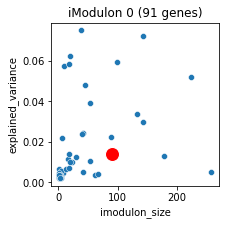

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS00390,0.053503,NaN,83141,83930,1,glycosyltransferase family 4 protein,M,Cell wall/membrane/envelope biogenesis,45,EQU24_RS00390,WP_017841409.1,||None,phospho-N-acetylmuramoyl-pentapeptide-transfer...,['phospho-N-acetylmuramoyl-pentapeptide-transf...
EQU24_RS00450,0.046464,NaN,95639,95957,1,phosphoribosyl-ATP diphosphatase,E,Amino acid transport and metabolism,51,EQU24_RS00450 // hisI // hisF // hisA // hisH ...,WP_017841397.1,||None,phosphoribosyl-ATP diphosphatase activity\ncar...,['phosphoribosyl-ATP diphosphatase activity'\n...
EQU24_RS00495,0.063648,plsY,102221,102797,1,glycerol-3-phosphate 1-O-acyltransferase PlsY,I,Lipid transport and metabolism,57,plsY,WP_201764901.1,plsY||plsY,acyl-phosphate glycerol-3-phosphate acyltransf...,['acyl-phosphate glycerol-3-phosphate acyltran...
EQU24_RS00600,0.059031,NaN,124502,124934,1,DedA family protein,S,Function unknown,72,EQU24_RS00600,WP_017841369.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS00660,0.061823,NaN,137803,138718,1,MlaD family protein,Q,"Secondary metabolites biosynthesis, transport,...",77,EQU24_RS00665 // EQU24_RS00660 // EQU24_RS0065...,WP_026130246.1,||None,integral component of membrane,['integral component of membrane']
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EQU24_RS22530,0.071379,NaN,3901146,3901290,-1,hypothetical protein,X,No COG annotation,1962,EQU24_RS17460 // EQU24_RS22535 // EQU24_RS1745...,WP_017842337.1,||None,NaN,[]
EQU24_RS22555,-0.050132,NaN,3971993,3972143,1,hypothetical protein,X,No COG annotation,1992,EQU24_RS22555 // EQU24_RS17785,WP_017842273.1,||None,NaN,[]
EQU24_RS22780,0.046196,NaN,4103004,4103181,-1,hypothetical protein,L,"Replication, recombination and repair",2557,EQU24_RS22780,WP_201764873.1,||None,NaN,[]


In [172]:
imod = 0 
imod_info(imod)

In [173]:
#view_imod_weights_on_genome(ica_data,0)

In [174]:
inspect_more(0)

glycosyltransferase family 4 protein
['phospho-N-acetylmuramoyl-pentapeptide-transferase activity'
 'integral component of membrane']
phosphoribosyl-ATP diphosphatase
['phosphoribosyl-ATP diphosphatase activity'
 'carboxylic acid biosynthetic process'
 'carboxylic acid metabolic process' 'pyrophosphatase activity'
 'ATP binding']
glycerol-3-phosphate 1-O-acyltransferase PlsY
['acyl-phosphate glycerol-3-phosphate acyltransferase activity'
 'phospholipid biosynthetic process' 'plasma membrane'
 'integral component of membrane']
DedA family protein
['integral component of membrane']
MlaD family protein
['integral component of membrane']
class I SAM-dependent methyltransferase
['methyltransferase activity' 'methylation']
heavy metal-binding domain-containing protein
[]
cell envelope integrity protein TolA
['integral component of membrane']
prepilin-type N-terminal cleavage/methylation domain-containing protein
['integral component of membrane']
hypothetical protein
[]
alpha/beta hydrolase


In [175]:
# Update the ica_data object
#ica_data.rename_imodulons({0:'0-uncharacterized_EW'})
#ica_data.imodulon_table.loc[0,'category'] = 'uncharacterized'

# seems like a mix of a lot of things... expression pattern not clear...

In [71]:
ica_data.imodulon_table.loc[0,'function'] = 'unclear_EW'
ica_data.imodulon_table.head()

,single_gene,imodulon_size,explained_variance,category,function
0,NaN,91,0.014136,uncharacterized,unclear_EW
1,NaN,41,0.005137,uncharacterized,NaN
SG_1,True,62,0.003533,single_gene,NaN
3,NaN,178,0.013264,uncharacterized,NaN
4,NaN,9,0.057266,uncharacterized,NaN


## iMod 1

iModulon 1


alt.LayerChart(...)

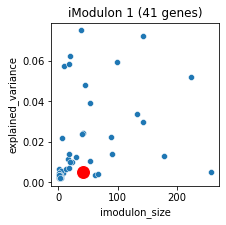

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name
0,1,NaN,8.763778e-07,0.000205,0.073171,1.0,0.136364,3.0,3.0,41.0,KEGG modules,M00641,NaN,"Multidrug resistance, efflux pump MexEF-OprN"
1,1,NaN,9.388478e-05,0.010985,0.048780,1.0,0.093023,2.0,2.0,41.0,KEGG modules,M00701,NaN,NaN


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS00075,0.077314,tatB,19487,19799,1,Sec-independent protein translocase protein TatB,U,"Intracellular trafficking, secretion, and vesi...",7,tatB // tatA,WP_017841462.1,tatB||tatB,TAT protein transport complex\nintegral compon...,['TAT protein transport complex' 'integral com...
EQU24_RS00670,-0.056757,NaN,139733,140330,1,hypothetical protein,X,No COG annotation,78,EQU24_RS00670,WP_017841358.1,||None,NaN,[]
EQU24_RS00675,-0.056219,NaN,140348,142232,-1,SCO family protein,C,Energy production and conversion,79,EQU24_RS00675,WP_017841357.1,||None,heme binding\nmetal ion binding\nelectron tran...,['heme binding' 'metal ion binding' 'electron ...
EQU24_RS01215,0.147245,NaN,244910,246491,-1,IS66 family transposase,L,"Replication, recombination and repair",151,EQU24_RS01215,WP_040575330.1,||None,NaN,[]
EQU24_RS02055,0.183374,NaN,432527,434726,1,TonB-dependent receptor,P,Inorganic ion transport and metabolism,257,EQU24_RS02055,WP_235726409.1,||None,cell outer membrane\nintegral component of mem...,['cell outer membrane' 'integral component of ...
EQU24_RS03025,0.053296,hcp,649987,651652,-1,hydroxylamine reductase,C,Energy production and conversion,372,hcp // EQU24_RS03020,WP_017840917.1,hcp||hcp,nitric oxide catabolic process\nhydroxylamine ...,['nitric oxide catabolic process' 'hydroxylami...
EQU24_RS08705,0.054562,NaN,1928777,1931024,1,fused MFS/spermidine synthase,J,"Translation, ribosomal structure and biogenesis",989,EQU24_RS08705,WP_017839858.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS10725,-0.073210,NaN,2382953,2384153,-1,NAD(P)/FAD-dependent oxidoreductase,S,Function unknown,1205,EQU24_RS10725 // EQU24_RS10720,WP_017839505.1,||None,oxidoreductase activity\n,['oxidoreductase activity' '']
EQU24_RS10740,-0.059935,NaN,2384845,2385241,-1,rhodanese-like domain-containing protein,P,Inorganic ion transport and metabolism,1207,EQU24_RS10740,WP_017839502.1,||None,NaN,[]


In [176]:
imod_info(1)

In [87]:
#view_imod_weights_on_genome(ica_data,1)
inspect_more(1)

Sec-independent protein translocase protein TatB
['TAT protein transport complex' 'integral component of plasma membrane'
 'protein transport by the Tat complex'
 'protein transmembrane transporter activity']
hypothetical protein
[]
SCO family protein
['heme binding' 'metal ion binding' 'electron transport chain'
 'cell redox homeostasis' 'electron transfer activity']
IS66 family transposase
[]
TonB-dependent receptor
['cell outer membrane' 'integral component of membrane']
hydroxylamine reductase
['nitric oxide catabolic process' 'hydroxylamine reductase activity'
 'cellular response to toxic substance'
 'response to reactive oxygen species'
 'cellular nitrogen compound catabolic process']
fused MFS/spermidine synthase
['integral component of membrane']
NAD(P)/FAD-dependent oxidoreductase
['oxidoreductase activity' '']
rhodanese-like domain-containing protein
[]
efflux RND transporter periplasmic adaptor subunit
['transmembrane transport' 'transmembrane transporter activity' 'membrane

In [74]:
# Update the ICA data object
#ica_data.rename_imodulons({1:'1-uncharacterized_EW'})
ica_data.imodulon_table.loc[1,'function'] = 'upMeOH|maybe_transport?_EW'
ica_data.imodulon_table.head()


,single_gene,imodulon_size,explained_variance,category,function
0,NaN,91,0.014136,uncharacterized,unclear_EW
1,NaN,41,0.005137,uncharacterized,upMeOH|maybe_transport?_EW
SG_1,True,62,0.003533,single_gene,NaN
3,NaN,178,0.013264,uncharacterized,NaN
4,NaN,9,0.057266,uncharacterized,NaN


## iMod 2

iModulon SG_1


alt.LayerChart(...)

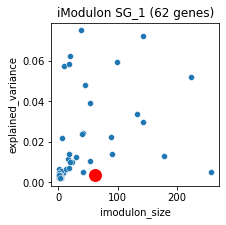

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS00525,0.053884,NaN,108456,108533,1,NaN,X,No COG annotation,61,EQU24_RS00525 // rpoD,NaN,||,NaN,[]
EQU24_RS01055,-0.043760,NaN,217442,217802,1,Tn3 family transposase,L,"Replication, recombination and repair",131,EQU24_RS01055 // EQU24_RS01050 // EQU24_RS2266...,WP_017841280.1,||None,"transposase activity\ntransposition, DNA-mediated","['transposase activity' 'transposition, DNA-me..."
EQU24_RS01135,0.049034,NaN,231558,231840,1,hypothetical protein,X,No COG annotation,142,EQU24_RS01140 // EQU24_RS01135 // EQU24_RS0113...,WP_017841271.1,||None,NaN,[]
EQU24_RS01650,0.051020,cysW,347490,348357,-1,sulfate ABC transporter permease subunit CysW,P,Inorganic ion transport and metabolism,206,cysT // cysW,WP_017841176.1,cysW||cysW,sulfate transmembrane transport\nABC-type sulf...,['sulfate transmembrane transport' 'ABC-type s...
EQU24_RS02055,0.339272,NaN,432527,434726,1,TonB-dependent receptor,P,Inorganic ion transport and metabolism,257,EQU24_RS02055,WP_235726409.1,||None,cell outer membrane\nintegral component of mem...,['cell outer membrane' 'integral component of ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EQU24_RS22765,-0.066457,NaN,3894485,3894593,1,hypothetical protein,X,No COG annotation,1959,EQU24_RS17400 // EQU24_RS22765,WP_017842347.1,||None,NaN,[]
EQU24_RS22805,0.061666,NaN,4609260,4609455,-1,hypothetical protein,X,No COG annotation,2560,EQU24_RS22805,WP_138767246.1,||None,NaN,[]
EQU24_RS22810,0.042931,NaN,4626446,4626764,-1,hypothetical protein,X,No COG annotation,2302,EQU24_RS22810 // EQU24_RS20505,WP_208976564.1,||None,NaN,[]


In [177]:
imod_info("SG_1")

In [86]:
#view_imod_weights_on_genome(ica_data,'SG_1')

In [83]:
ica_data.imodulon_table.loc["SG_1",'function'] = 'sg-tonB_EW'



In [84]:
ica_data.imodulon_table.head()

,single_gene,imodulon_size,explained_variance,category,function
0,NaN,91,0.014136,uncharacterized,unclear_EW
1,NaN,41,0.005137,uncharacterized,upMeOH|maybe_transport?_EW
SG_1,True,62,0.003533,single_gene,sg-tonB_EW
3,NaN,178,0.013264,uncharacterized,NaN
4,NaN,9,0.057266,uncharacterized,NaN


### iModulon 3


iModulon 3


alt.LayerChart(...)

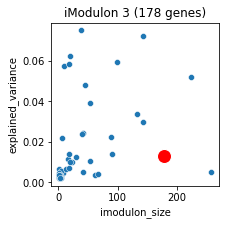

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name
0,3,sulfate transmembrane transport,4.144723e-07,0.000887,0.033708,0.666667,0.064171,6.0,9.0,178.0,GO,NaN,NaN,NaN
1,3,ABC-type sulfate transporter activity,3.183189e-06,0.003404,0.022472,1.000000,0.043956,4.0,4.0,178.0,GO,NaN,NaN,NaN
2,3,NaN,3.183189e-06,0.000745,0.022472,1.000000,0.043956,4.0,4.0,178.0,KEGG modules,M00185,NaN,NaN


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS00105,-0.045226,crp,24340,24994,-1,cAMP-activated global transcriptional regulato...,K,Transcription,11,crp // EQU24_RS00100,WP_014146545.1,crp||crp,"regulation of transcription, DNA-templated\nDN...","['regulation of transcription, DNA-templated' ..."
EQU24_RS00145,-0.040330,NaN,34142,34445,-1,hypothetical protein,J,"Translation, ribosomal structure and biogenesis",16,EQU24_RS00155 // EQU24_RS00150 // EQU24_RS00145,WP_014146553.1,||None,NaN,[]
EQU24_RS00990,-0.036127,aqpZ,203428,204151,1,aquaporin Z,G,Carbohydrate transport and metabolism,120,aqpZ,WP_235726467.1,aqpZ||aqpZ,water homeostasis\nregulation of cell size\nwa...,['water homeostasis' 'regulation of cell size'...
EQU24_RS01170,0.032618,NaN,235812,237102,-1,Y-family DNA polymerase,L,"Replication, recombination and repair",147,umuD // EQU24_RS01170,WP_017841266.1,||None,DNA repair\ndamaged DNA binding\ntransferase a...,['DNA repair' 'damaged DNA binding' 'transfera...
EQU24_RS01215,-0.039000,NaN,244910,246491,-1,IS66 family transposase,L,"Replication, recombination and repair",151,EQU24_RS01215,WP_040575330.1,||None,NaN,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EQU24_RS22390,-0.035032,NaN,2602062,2602227,1,hypothetical protein,X,No COG annotation,2525,EQU24_RS22390,WP_017839339.1,||None,NaN,[]
EQU24_RS22410,0.049640,NaN,2736544,2736847,-1,hypothetical protein,X,No COG annotation,2527,EQU24_RS22410,WP_017839228.1,||None,NaN,[]
EQU24_RS22510,-0.049260,NaN,3684540,3684699,-1,hypothetical protein,X,No COG annotation,2537,EQU24_RS22510,WP_175421698.1,||None,NaN,[]


In [178]:
#imod_info(3)
imod_info(3)

In [216]:
#view_imod_weights_on_genome(ica_data,3)

In [179]:
ica_data.imodulon_table.loc[3,'function'] = 'sulfate transport/FM23_TR3_QC-outlier-response_EW'
ica_data.imodulon_table.head()


,single_gene,imodulon_size,explained_variance,category,function
0,NaN,91,0.014136,uncharacterized,unclear_EW
1,NaN,41,0.005137,uncharacterized,upMeOH|maybe_transport?_EW
SG_1,True,62,0.003533,single_gene,sg-tonB_EW
3,NaN,178,0.013264,uncharacterized,sulfate transport/FM23_TR3_QC-outlier-response_EW
4,NaN,9,0.057266,uncharacterized,NaN


## iMod 4

iModulon 4


alt.LayerChart(...)

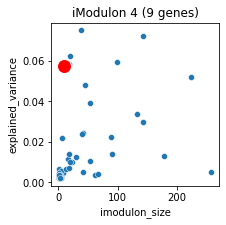

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name
0,4,NaN,2.383755e-15,5.053561e-13,0.666667,0.600000,0.631579,6.0,10.0,9.0,KEGG pathways,map01220,Degradation of aromatic compounds,NaN
2,4,methane metabolic process,6.635245e-13,1.419279e-09,0.555556,0.625000,0.588235,5.0,8.0,9.0,GO,NaN,NaN,NaN
3,4,NaN,1.047559e-14,2.451289e-12,0.666667,0.500000,0.571429,6.0,12.0,9.0,KEGG modules,M00174,NaN,"Methane oxidation, methanotroph, methane => fo..."
3,4,methane monooxygenase activity,1.491737e-12,1.595413e-09,0.555556,0.555556,0.555556,5.0,9.0,9.0,GO,NaN,NaN,NaN
5,4,catalytic complex,1.485111e-10,6.353307e-08,0.444444,0.666667,0.533333,4.0,6.0,9.0,GO,NaN,NaN,NaN
6,4,methane monooxygenase complex,1.485111e-10,6.353307e-08,0.444444,0.666667,0.533333,4.0,6.0,9.0,GO,NaN,NaN,NaN
4,4,monooxygenase activity,5.460966e-12,3.893669e-09,0.555556,0.454545,0.500000,5.0,11.0,9.0,GO,NaN,NaN,NaN
7,4,protein-containing complex,3.461940e-10,1.057870e-07,0.444444,0.571429,0.500000,4.0,7.0,9.0,GO,NaN,NaN,NaN
8,4,cellular alkane metabolic process,3.461940e-10,1.057870e-07,0.444444,0.571429,0.500000,4.0,7.0,9.0,GO,NaN,NaN,NaN
9,4,"oxidoreductase activity, acting on paired dono...",1.243911e-09,3.325906e-07,0.444444,0.444444,0.444444,4.0,9.0,9.0,GO,NaN,NaN,NaN


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS05885,0.289667,mmoX,1283573,1285151,1,aromatic/alkene/methane monooxygenase hydroxyl...,H,Coenzyme transport and metabolism,671,EQU24_RS05885,WP_017840379.1,||None,methane monooxygenase activity\nmethane metabo...,['methane monooxygenase activity' 'methane met...
EQU24_RS05890,0.276013,mmoY,1285264,1286443,1,aromatic/alkene monooxygenase hydroxylase subu...,H,Coenzyme transport and metabolism,672,EQU24_RS05900 // EQU24_RS05895 // EQU24_RS05890,WP_017840378.1,||None,methane monooxygenase activity\nmethane metabo...,['methane monooxygenase activity' 'methane met...
EQU24_RS05895,0.283490,mmoB,1286453,1286879,1,MmoB/DmpM family protein,C,Energy production and conversion,672,EQU24_RS05900 // EQU24_RS05895 // EQU24_RS05890,WP_017840377.1,||None,methane monooxygenase activity\nmethane metabo...,['methane monooxygenase activity' 'methane met...
EQU24_RS05900,0.273106,mmoZ,1286888,1287392,1,hypothetical protein,H,Coenzyme transport and metabolism,672,EQU24_RS05900 // EQU24_RS05895 // EQU24_RS05890,WP_017840376.1,||None,methane monooxygenase activity\nmethane metabo...,['methane monooxygenase activity' 'methane met...
EQU24_RS05905,0.242308,mmoD,1287685,1287934,1,soluble methane monooxygenase-binding protein ...,X,No COG annotation,673,EQU24_RS05910 // mmoD,WP_201764852.1,mmoD||mmoD,monooxygenase activity\n,['monooxygenase activity' '']
EQU24_RS05910,0.244073,mmoC,1287957,1288995,1,FAD-binding oxidoreductase,C,Energy production and conversion,673,EQU24_RS05910 // mmoD,WP_017840374.1,||None,methane monooxygenase activity\nmethane metabo...,['methane monooxygenase activity' 'methane met...
EQU24_RS05915,0.221179,NaN,1289516,1289897,1,BLUF domain-containing protein,S,Function unknown,674,EQU24_RS05915,WP_235726398.1,||None,FAD binding\nblue light signaling pathway\nblu...,['FAD binding' 'blue light signaling pathway'\...
EQU24_RS05920,0.241057,NaN,1290051,1290351,1,hypothetical protein,X,No COG annotation,675,EQU24_RS05920,WP_017840372.1,||None,NaN,[]
EQU24_RS05925,0.234747,mmoG,1290558,1292238,1,likely chaperone for smmo,O,"Post-translational modification, protein turno...",676,groEL,WP_017840371.1,groEL||groEL,ATP binding\nprotein refolding,['ATP binding' 'protein refolding']


In [181]:
imod_info(4)

In [182]:
ica_data.imodulon_table.loc[4,'function'] = 'smmo_cluster_EW'


## iMod 5

iModulon 5


alt.LayerChart(...)

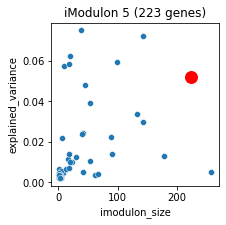

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name
23,5,translation,0.000003,0.003367,0.062780,0.225806,0.098246,14.0,62.0,223.0,GO,NaN,NaN,NaN
22,5,structural constituent of ribosome,0.000003,0.003367,0.058296,0.240741,0.093863,13.0,54.0,223.0,GO,NaN,NaN,NaN
5,5,NaN,0.000003,0.000667,0.058296,0.240741,0.093863,13.0,54.0,223.0,KEGG pathways,map03010,Ribosome,NaN
4,5,NaN,0.000003,0.000737,0.058296,0.240741,0.093863,13.0,54.0,223.0,KEGG modules,M00178,NaN,NaN
24,5,ribosome,0.000005,0.003554,0.053812,0.250000,0.088561,12.0,48.0,223.0,GO,NaN,NaN,NaN


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS00105,0.054742,crp,24340,24994,-1,cAMP-activated global transcriptional regulato...,K,Transcription,11,crp // EQU24_RS00100,WP_014146545.1,crp||crp,"regulation of transcription, DNA-templated\nDN...","['regulation of transcription, DNA-templated' ..."
EQU24_RS00110,0.072114,NaN,25137,25554,1,OsmC family protein,O,"Post-translational modification, protein turno...",12,speD // EQU24_RS00110,WP_017841455.1,||None,NaN,[]
EQU24_RS00505,0.062100,rpsU,104077,104311,1,30S ribosomal protein S21,J,"Translation, ribosomal structure and biogenesis",59,EQU24_RS00510 // rpsU,WP_014146611.1,rpsU||rpsU,ribosome\ntranslation\nstructural constituent ...,['ribosome' 'translation' 'structural constitu...
EQU24_RS00510,0.057226,NaN,104333,104783,1,GatB/YqeY domain-containing protein,S,Function unknown,59,EQU24_RS00510 // rpsU,WP_017841386.1,||None,"carbon-nitrogen ligase activity, with glutamin...","['carbon-nitrogen ligase activity, with glutam..."
EQU24_RS00720,0.032192,NaN,149248,150148,1,phosphoribosylaminoimidazolesuccinocarboxamide...,F,Nucleotide transport and metabolism,87,EQU24_RS00720,WP_017841349.1,||None,'de novo' IMP biosynthetic process\nATP bindin...,"[""'de novo' IMP biosynthetic process"" 'ATP bin..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EQU24_RS22495,-0.089670,NaN,3592689,3592968,-1,hypothetical protein,X,No COG annotation,1804,EQU24_RS16000 // EQU24_RS15995 // EQU24_RS2250...,WP_175421697.1,||None,NaN,[]
EQU24_RS22640,0.043352,NaN,4687769,4687946,-1,hypothetical protein,X,No COG annotation,2340,EQU24_RS22640 // EQU24_RS20815,WP_017841712.1,||None,NaN,[]
EQU24_RS22800,-0.036919,NaN,4587226,4587418,-1,hypothetical protein,X,No COG annotation,2559,EQU24_RS22800,WP_017841798.1,||None,NaN,[]


In [183]:
imod_info(5)

In [184]:
ica_data.imodulon_table.loc[5,'function'] = 'ribosomal/translation_EW'


## iMod 6

iModulon 6


alt.LayerChart(...)

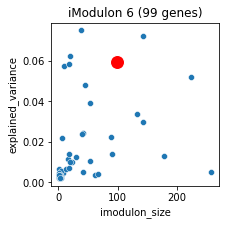

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name
26,6,DNA repair,3.750152e-07,0.000401,0.080808,0.258065,0.123077,8.0,31.0,99.0,GO,NaN,NaN,NaN
25,6,SOS response,1.862444e-08,0.000040,0.070707,0.466667,0.122807,7.0,15.0,99.0,GO,NaN,NaN,NaN
5,6,NaN,5.069027e-05,0.011862,0.030303,0.750000,0.058252,3.0,4.0,99.0,KEGG modules,M00729,NaN,NaN


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS01125,0.043869,NaN,229960,230614,1,hypothetical protein,X,No COG annotation,142,EQU24_RS01140 // EQU24_RS01135 // EQU24_RS0113...,WP_017841273.1,||None,NaN,[]
EQU24_RS01130,0.060288,NaN,230606,231530,1,ATP-binding protein,U,"Intracellular trafficking, secretion, and vesi...",142,EQU24_RS01140 // EQU24_RS01135 // EQU24_RS0113...,WP_017841272.1,||None,ATP binding\nintegral component of membrane,['ATP binding' 'integral component of membrane']
EQU24_RS01135,0.086491,NaN,231558,231840,1,hypothetical protein,X,No COG annotation,142,EQU24_RS01140 // EQU24_RS01135 // EQU24_RS0113...,WP_017841271.1,||None,NaN,[]
EQU24_RS01140,0.041121,NaN,231871,232978,1,metal-dependent hydrolase,S,Function unknown,142,EQU24_RS01140 // EQU24_RS01135 // EQU24_RS0113...,WP_017841270.1,||None,cellular response to DNA damage stimulus\nSOS ...,['cellular response to DNA damage stimulus' 'S...
EQU24_RS01150,0.064879,NaN,234038,234461,1,hypothetical protein,X,No COG annotation,144,EQU24_RS01150,WP_017841268.1,||None,NaN,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EQU24_RS22570,0.087990,NaN,4233827,4233983,1,hypothetical protein,X,No COG annotation,2130,EQU24_RS22570 // lexA,WP_014149976.1,||None,NaN,[]
EQU24_RS22585,0.060567,NaN,4420667,4420814,1,hypothetical protein,X,No COG annotation,2545,EQU24_RS22585,WP_017841924.1,||None,NaN,[]
EQU24_RS22590,0.073427,NaN,4470612,4470756,-1,hypothetical protein,X,No COG annotation,2238,lexA // EQU24_RS22590,WP_017841219.1,||None,NaN,[]


In [185]:
imod_info(6)

In [186]:
ica_data.imodulon_table.loc[6,'function'] = 'SOS-response_EW'


## iMod 7

iModulon 7


alt.LayerChart(...)

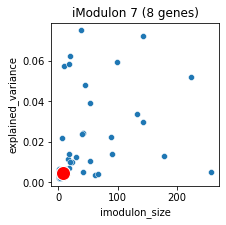

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS05420,0.309172,NaN,1163549,1163954,1,biopolymer transporter ExbD,U,"Intracellular trafficking, secretion, and vesi...",611,EQU24_RS05430 // EQU24_RS05425 // EQU24_RS05420,WP_014149416.1,||None,protein transport\nplasma membrane\nintegral c...,['protein transport' 'plasma membrane' 'integr...
EQU24_RS10965,0.133337,NaN,2446321,2446762,-1,phage tail protein,S,Function unknown,1226,EQU24_RS10970 // EQU24_RS10965 // EQU24_RS1096...,WP_014148651.1,||None,acyltransferase activity\nstructural molecule ...,['acyltransferase activity' 'structural molecu...
EQU24_RS14480,0.342180,NaN,3237002,3237146,-1,DUF3096 domain-containing protein,S,Function unknown,1621,EQU24_RS14480,WP_014148969.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS16370,0.141081,NaN,3676994,3677465,-1,helix-turn-helix domain-containing protein,X,No COG annotation,1846,EQU24_RS16370 // EQU24_RS16365,WP_017842551.1,||None,DNA binding,['DNA binding']
EQU24_RS16375,0.231615,NaN,3677719,3678100,-1,hypothetical protein,X,No COG annotation,1847,EQU24_RS16375,WP_138767202.1,||None,NaN,[]
EQU24_RS20320,0.281209,NaN,4585274,4585535,-1,DUF2442 domain-containing protein,S,Function unknown,2282,EQU24_RS20325 // EQU24_RS22620 // EQU24_RS20320,WP_017841802.1,||None,NaN,[]
EQU24_RS22355,0.153906,NaN,1865054,1865348,1,hypothetical protein,X,No COG annotation,2520,EQU24_RS22355,WP_017839903.1,||None,NaN,[]
EQU24_RS22460,0.175748,NaN,3274859,3275009,-1,hypothetical protein,X,No COG annotation,2535,EQU24_RS22460,WP_175421689.1,||None,NaN,[]


In [187]:
imod_info(7)

In [215]:
#view_imod_weights_on_genome(ica_data,7)

In [189]:
ica_data.imodulon_table.loc[7,'function'] = 'outlier-response-FM34_T6_TR3_QC_EW'


## iMod 8

iModulon 8


alt.LayerChart(...)

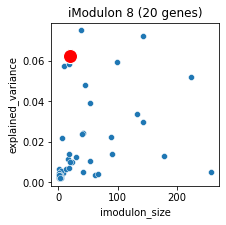

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS00940,0.170228,NaN,193739,193970,1,hypothetical protein,X,No COG annotation,111,EQU24_RS00940,WP_017841310.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS01900,0.117956,NaN,402128,402632,1,RNA polymerase sigma factor,K,Transcription,239,EQU24_RS01900,WP_017841129.1,||None,"regulation of DNA-templated transcription, ini...","['regulation of DNA-templated transcription, i..."
EQU24_RS07680,0.166254,corA,1690300,1691008,-1,copper(I)-binding protein CorA,X,No COG annotation,870,corA,WP_017840047.1,corA||corA,metal ion binding,['metal ion binding']
EQU24_RS19450,0.106952,NaN,4358355,4359330,-1,DUF58 domain-containing protein,S,Function unknown,2188,EQU24_RS19450 // EQU24_RS19445,WP_017841963.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS19455,0.123163,NaN,4360080,4360986,-1,MoxR family ATPase,S,Function unknown,2189,EQU24_RS19455,WP_014146992.1,||None,ATP hydrolysis activity\nATP binding,['ATP hydrolysis activity' 'ATP binding']
EQU24_RS19460,0.115946,NaN,4361052,4361754,-1,hypothetical protein,X,No COG annotation,2190,EQU24_RS19460,WP_014146991.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS19465,0.143943,NaN,4362167,4363652,-1,type II secretion system GspH family protein,X,No COG annotation,2191,EQU24_RS19470 // EQU24_RS19465,WP_017841961.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS19470,0.160585,NaN,4363642,4366321,-1,S8 family serine peptidase,Q,"Secondary metabolites biosynthesis, transport,...",2191,EQU24_RS19470 // EQU24_RS19465,WP_175421707.1,||None,polysaccharide catabolic process\nserine-type ...,['polysaccharide catabolic process' 'serine-ty...
EQU24_RS19475,0.178926,NaN,4366809,4368060,-1,hypothetical protein,X,No COG annotation,2192,EQU24_RS19480 // EQU24_RS19475,WP_138767233.1,||None,aspartic-type endopeptidase activity\nproteolysis,['aspartic-type endopeptidase activity' 'prote...


In [190]:
imod_info(8)

In [214]:
#view_imod_weights_on_genome(ica_data,8)

In [192]:
#ica_data.imodulon_table.loc[8,'category'] = 'functional'
ica_data.imodulon_table.loc[8,'function'] = 'cu-repression/secretion/alexey-gene-cluster_EW'

# for cluster matching 8
#ica_data.change_threshold(8, 0.14)


In [193]:
ica_data.imodulon_table.head(10)

,single_gene,imodulon_size,explained_variance,category,function
0,NaN,91,0.014136,uncharacterized,unclear_EW
1,NaN,41,0.005137,uncharacterized,upMeOH|maybe_transport?_EW
SG_1,True,62,0.003533,single_gene,sg-tonB_EW
3,NaN,178,0.013264,uncharacterized,sulfate transport/FM23_TR3_QC-outlier-response_EW
4,NaN,9,0.057266,uncharacterized,smmo_cluster_EW
5,NaN,223,0.052252,uncharacterized,ribosomal/translation_EW
6,NaN,99,0.059165,uncharacterized,SOS-response_EW
7,NaN,8,0.004512,uncharacterized,outlier-response-FM34_T6_TR3_QC_EW
8,NaN,20,0.062186,uncharacterized,cu-repression/secretion/alexey-gene-cluster_EW
SG_2,True,1,0.006651,single_gene,NaN


## iMod 9

iModulon SG_2


alt.LayerChart(...)

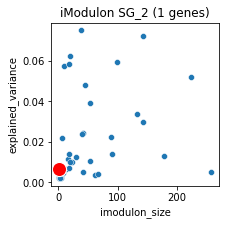

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS17330,0.736011,NaN,3884125,3884449,-1,(2Fe-2S) ferredoxin domain-containing protein,C,Energy production and conversion,1950,EQU24_RS17330 // EQU24_RS17325,WP_017842361.1,||None,NaN,[]


In [195]:
imod_info("SG_2")

In [196]:
ica_data.imodulon_table.loc["SG_2",'function'] = 'sg-ferredoxin_domain_EW'


## iMod 10

iModulon 10


alt.LayerChart(...)

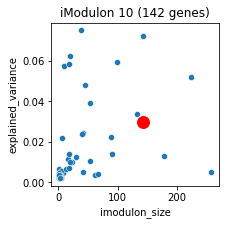

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name
6,10,NaN,0.000005,0.001115,0.035211,0.555556,0.066225,5.0,9.0,142.0,KEGG modules,M00258,NaN,NaN
7,10,NaN,0.000141,0.016484,0.028169,0.444444,0.052980,4.0,9.0,142.0,KEGG modules,M00742,NaN,NaN


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS00090,0.044031,thyA,22412,23246,1,thymidylate synthase,F,Nucleotide transport and metabolism,9,thyA // lgt,WP_017841458.1,thyA||thyA,dTTP biosynthetic process\ndTMP biosynthetic p...,['dTTP biosynthetic process' 'dTMP biosyntheti...
EQU24_RS00095,0.065183,NaN,23251,23782,-1,nucleoside triphosphate pyrophosphohydrolase f...,X,No COG annotation,10,EQU24_RS00095,WP_017841457.1,||None,hydrolase activity,['hydrolase activity']
EQU24_RS00160,0.038800,NaN,36419,36716,-1,hypothetical protein,X,No COG annotation,17,EQU24_RS00160,WP_017841445.1,||None,membrane,['membrane']
EQU24_RS00190,-0.036675,NaN,42656,42884,-1,hypothetical protein,X,No COG annotation,23,EQU24_RS00195 // EQU24_RS00190,WP_138767047.1,||None,transposase activity\nDNA binding\ntranspositi...,['transposase activity' 'DNA binding' 'transpo...
EQU24_RS00450,0.043507,NaN,95639,95957,1,phosphoribosyl-ATP diphosphatase,E,Amino acid transport and metabolism,51,EQU24_RS00450 // hisI // hisF // hisA // hisH ...,WP_017841397.1,||None,phosphoribosyl-ATP diphosphatase activity\ncar...,['phosphoribosyl-ATP diphosphatase activity'\n...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EQU24_RS22375,0.037389,NaN,2374461,2374611,1,hypothetical protein,X,No COG annotation,2522,EQU24_RS22375 // EQU24_RS10675,WP_175421678.1,||None,NaN,[]
EQU24_RS22430,0.063297,NaN,3044768,3045017,1,hypothetical protein,X,No COG annotation,2530,EQU24_RS22430,WP_175421687.1,||None,NaN,[]
EQU24_RS22495,-0.039704,NaN,3592689,3592968,-1,hypothetical protein,X,No COG annotation,1804,EQU24_RS16000 // EQU24_RS15995 // EQU24_RS2250...,WP_175421697.1,||None,NaN,[]


In [197]:
imod_info(10)

In [213]:
inspect_more(10)
#view_imod_weights_on_genome(ica_data,10)

thymidylate synthase
['dTTP biosynthetic process' 'dTMP biosynthetic process'
 'thymidylate synthase activity' 'cytoplasm' 'methylation']
nucleoside triphosphate pyrophosphohydrolase family protein
['hydrolase activity']
hypothetical protein
['membrane']
hypothetical protein
['transposase activity' 'DNA binding' 'transposition, DNA-mediated']
phosphoribosyl-ATP diphosphatase
['phosphoribosyl-ATP diphosphatase activity'
 'carboxylic acid biosynthetic process'
 'carboxylic acid metabolic process' 'pyrophosphatase activity'
 'ATP binding']
type II toxin-antitoxin system HipA family toxin
['phosphorylation' 'kinase activity']
helix-turn-helix domain-containing protein
['DNA binding']
hypothetical protein
[]
beta-ketoacyl-ACP synthase
['3-oxoacyl-[acyl-carrier-protein] synthase activity'
 '3-oxoacyl-[acyl-carrier-protein] synthase activity']
DUF504 domain-containing protein
[]
MotA/TolQ/ExbB proton channel family protein
['protein transport' 'integral component of membrane']
energy transduc

In [200]:
ica_data.imodulon_table.loc[10,'function'] = 'fatty-acid-beta-oxidation/membrane?_EW'


## iMod 11

iModulon 11


alt.LayerChart(...)

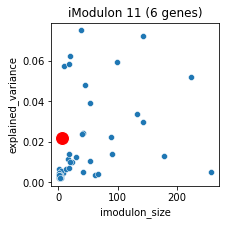

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name
27,11,alcohol dehydrogenase (cytochrome c(L)) activity,1.717405e-06,0.003674,0.333333,1.000000,0.500000,2.0,6.0,6.0,GO,NaN,NaN,NaN
7,11,NaN,1.714118e-05,0.001817,0.333333,0.400000,0.363636,2.0,5.0,6.0,KEGG pathways,map00625,Chloroalkane and chloroalkene degradation,NaN
8,11,NaN,1.126270e-04,0.026355,0.333333,0.166667,0.222222,2.0,12.0,6.0,KEGG modules,M00174,NaN,"Methane oxidation, methanotroph, methane => fo..."
9,11,NaN,4.673853e-04,0.024771,0.333333,0.083333,0.133333,2.0,24.0,6.0,KEGG pathways,map00010,Glycolysis / Gluconeogenesis,NaN
6,11,NaN,7.809565e-07,0.000166,0.666667,0.061538,0.112676,4.0,65.0,6.0,KEGG pathways,map00680,Methane metabolism,NaN
8,11,NaN,8.261615e-05,0.005838,0.666667,0.019231,0.037383,4.0,208.0,6.0,KEGG pathways,map01120,Microbial metabolism in diverse environments,NaN


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS18110,0.251502,mxaS,4038027,4038882,-1,MxaS protein,S,Function unknown,2028,EQU24_RS18115 // EQU24_RS18110,WP_017842211.1,||None,NaN,[]
EQU24_RS18120,0.253565,moxR,4040146,4041163,-1,MoxR family ATPase,S,Function unknown,2029,EQU24_RS18120,WP_017842209.1,||None,ATP hydrolysis activity\nATP binding,['ATP hydrolysis activity' 'ATP binding']
EQU24_RS18125,0.309174,moxI,4041358,4041643,-1,methanol dehydrogenase [cytochrome c] subunit,M,Cell wall/membrane/envelope biogenesis,2030,moxJ // moxG // EQU24_RS18125,WP_017842208.1,||None,methanol oxidation\nalcohol dehydrogenase (NAD...,['methanol oxidation' 'alcohol dehydrogenase (...
EQU24_RS18130,0.334363,moxG,4041660,4042134,-1,"cytochrome c(L), periplasmic",C,Energy production and conversion,2030,moxJ // moxG // EQU24_RS18125,WP_017842207.1,moxG||moxG,iron ion binding\nheme binding\nelectron trans...,['iron ion binding' 'heme binding' 'electron t...
EQU24_RS18135,0.336796,moxJ,4042150,4042996,-1,methanol oxidation system protein MoxJ,E,Amino acid transport and metabolism,2030,moxJ // moxG // EQU24_RS18125,WP_017842206.1,moxJ||moxJ,methanol catabolic process\nperiplasmic space,['methanol catabolic process' 'periplasmic spa...
EQU24_RS18140,0.342016,moxF,4043061,4044870,-1,methanol/ethanol family PQQ-dependent dehydrog...,G,Carbohydrate transport and metabolism,2031,EQU24_RS18140,WP_017842205.1,||None,calcium ion binding\nalcohol dehydrogenase (cy...,['calcium ion binding' 'alcohol dehydrogenase ...


In [201]:
imod_info(11)

In [202]:
ica_data.imodulon_table.loc[11,'function'] = 'mxa-gene-cluster_EW'


## iMod 12

iModulon 12


alt.LayerChart(...)

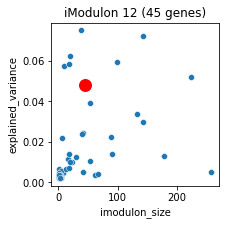

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name
10,12,NaN,2.524814e-15,5.352605e-13,0.311111,0.205882,0.247788,14.0,68.0,45.0,KEGG pathways,map02030,Bacterial chemotaxis,NaN
9,12,NaN,1.031777e-08,2.414357e-06,0.155556,0.250000,0.191781,7.0,28.0,45.0,KEGG modules,M00506,NaN,NaN
12,12,NaN,2.758484e-07,1.949329e-05,0.133333,0.222222,0.166667,6.0,27.0,45.0,KEGG pathways,map00910,Nitrogen metabolism,NaN
11,12,NaN,1.676208e-11,1.776780e-09,0.311111,0.112000,0.164706,14.0,125.0,45.0,KEGG pathways,map02020,Two-component system,NaN
28,12,chemotaxis,2.489809e-07,5.325702e-04,0.155556,0.162791,0.159091,7.0,43.0,45.0,GO,NaN,NaN,NaN
10,12,NaN,1.166585e-06,1.364905e-04,0.066667,1.000000,0.125000,3.0,3.0,45.0,KEGG modules,M00438,NaN,NaN
30,12,signal transduction,2.326251e-05,2.005298e-02,0.155556,0.084337,0.109375,7.0,84.0,45.0,GO,NaN,NaN,NaN
29,12,phosphorelay signal transduction system,2.812480e-05,2.005298e-02,0.200000,0.058442,0.090452,9.0,154.0,45.0,GO,NaN,NaN,NaN


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS02975,-0.061362,NaN,635255,635465,1,hypothetical protein,X,No COG annotation,363,EQU24_RS02975,WP_014147102.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS03640,0.072545,NaN,780870,782136,1,hypothetical protein,E,Amino acid transport and metabolism,438,EQU24_RS03640,WP_017840798.1,||None,NaN,[]
EQU24_RS04700,0.065711,NaN,989867,992348,1,glycogen/starch/alpha-glucan phosphorylase,G,Carbohydrate transport and metabolism,538,EQU24_RS04700,WP_017840604.1,||None,glycogen phosphorylase activity\nlinear malto-...,['glycogen phosphorylase activity'\n 'linear m...
EQU24_RS05260,-0.060572,NaN,1119640,1119949,1,c-type cytochrome,C,Energy production and conversion,596,EQU24_RS05260,WP_017840498.1,||None,iron ion binding\nplastid\nheme binding\nelect...,['iron ion binding' 'plastid' 'heme binding' '...
EQU24_RS05720,0.060994,NaN,1237807,1239430,1,SulP family inorganic anion transporter,U,"Intracellular trafficking, secretion, and vesi...",650,EQU24_RS05720,WP_017840412.1,||None,sulfate transmembrane transport\nsecondary act...,['sulfate transmembrane transport'\n 'secondar...
EQU24_RS05735,-0.064192,NaN,1240694,1241078,1,group 1 truncated hemoglobin,C,Energy production and conversion,652,EQU24_RS05740 // EQU24_RS05735,WP_017840409.1,||None,oxygen transport\nheme binding\nmetal ion bind...,['oxygen transport' 'heme binding' 'metal ion ...
EQU24_RS07240,0.066867,NaN,1596550,1597597,1,sterol desaturase family protein,I,Lipid transport and metabolism,825,EQU24_RS07240,WP_017840129.1,||None,iron ion binding\nlipid biosynthetic process\n...,['iron ion binding' 'lipid biosynthetic proces...
EQU24_RS09010,0.066537,NaN,1991857,1992667,-1,formate/nitrite transporter family protein,P,Inorganic ion transport and metabolism,1022,EQU24_RS09010,WP_017839809.1,||None,integral component of membrane\ntransmembrane ...,['integral component of membrane' 'transmembra...
EQU24_RS10515,0.110201,NaN,2336585,2336855,-1,hypothetical protein,X,No COG annotation,1186,EQU24_RS10515,WP_014148531.1,||None,NaN,[]


In [203]:
imod_info(12)

In [212]:
#view_imod_weights_on_genome(ica_data,12)

In [205]:
ica_data.imodulon_table.loc[12,'function'] = 'chemotaxis/signal-transduction/highest-exp-var_EW'


## iMod 13

iModulon 13


alt.LayerChart(...)

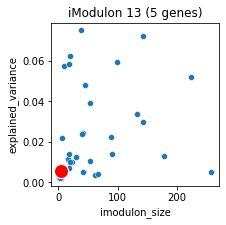

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS10965,0.214091,NaN,2446321,2446762,-1,phage tail protein,S,Function unknown,1226,EQU24_RS10970 // EQU24_RS10965 // EQU24_RS1096...,WP_014148651.1,||None,acyltransferase activity\nstructural molecule ...,['acyltransferase activity' 'structural molecu...
EQU24_RS16370,0.272439,NaN,3676994,3677465,-1,helix-turn-helix domain-containing protein,X,No COG annotation,1846,EQU24_RS16370 // EQU24_RS16365,WP_017842551.1,||None,DNA binding,['DNA binding']
EQU24_RS16380,0.204325,NaN,3678261,3678483,-1,hypothetical protein,X,No COG annotation,1848,EQU24_RS16380,WP_017842548.1,||None,NaN,[]
EQU24_RS22515,0.500468,NaN,3885805,3885958,-1,hypothetical protein,X,No COG annotation,1951,nifV // EQU24_RS22515 // cysE // EQU24_RS17335,WP_017842358.1,||None,NaN,[]
EQU24_RS22585,0.445794,NaN,4420667,4420814,1,hypothetical protein,X,No COG annotation,2545,EQU24_RS22585,WP_017841924.1,||None,NaN,[]


In [206]:
imod_info(13)

In [211]:
#view_imod_weights_on_genome(ica_data,13)

In [208]:
ica_data.imodulon_table.loc[13,'function'] = 'unclear_EW'


## iMod 14

iModulon 14


alt.LayerChart(...)

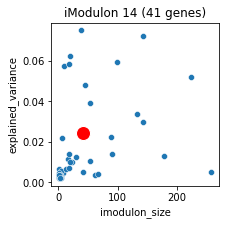

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS22375,0.177911,NaN,2374461,2374611,1,hypothetical protein,X,No COG annotation,2522,EQU24_RS22375 // EQU24_RS10675,WP_175421678.1,||None,NaN,[]
EQU24_RS07500,0.175765,NaN,1653733,1654084,1,type II toxin-antitoxin system PemK/MazF famil...,T,Signal transduction mechanisms,852,brxL // EQU24_RS07515 // EQU24_RS07510 // EQU2...,WP_040575299.1,||None,DNA binding,['DNA binding']
EQU24_RS01275,0.172974,NaN,257566,257776,1,WGR domain-containing protein,S,Function unknown,158,EQU24_RS01275,WP_017841242.1,||None,NaN,[]
EQU24_RS05350,0.169657,NaN,1136684,1136963,-1,DUF29 family protein,T,Signal transduction mechanisms,605,EQU24_RS05350,WP_235726400.1,||None,NaN,[]
EQU24_RS22280,0.168378,NaN,1144990,1145137,1,hypothetical protein,X,No COG annotation,2511,EQU24_RS22280,WP_017840473.1,||None,NaN,[]
EQU24_RS23110,0.167810,NaN,4273940,4274030,-1,hypothetical protein,X,No COG annotation,2582,EQU24_RS23110,WP_017842034.1,||None,NaN,[]
EQU24_RS22340,0.164609,NaN,1792338,1792488,1,hypothetical protein,X,No COG annotation,920,EQU24_RS22340 // EQU24_RS08125 // EQU24_RS08120,WP_017839959.1,||None,NaN,[]
EQU24_RS20765,0.154777,NaN,4677500,4678028,-1,phosphatase PAP2 family protein,I,Lipid transport and metabolism,2332,EQU24_RS20765 // EQU24_RS20760,WP_017841722.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS17080,0.146499,nifT,3841334,3841547,1,putative nitrogen fixation protein NifT,Q,"Secondary metabolites biosynthesis, transport,...",1926,EQU24_RS17100 // EQU24_RS17095 // EQU24_RS1709...,WP_017842412.1,nifT||nifT,nitrogen fixation,['nitrogen fixation']


In [221]:
imod_info(14)

In [222]:
ica_data.imodulon_table.loc[14,'function'] = 'outlier-response_FM20TR1_QC_EW'


## iMod 15

iModulon 15


alt.LayerChart(...)

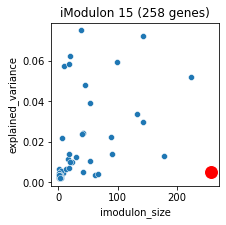

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS14350,0.112624,NaN,3204940,3205186,-1,LapA family protein,X,No COG annotation,1611,EQU24_RS14350,WP_017838835.1,||None,integral component of plasma membrane,['integral component of plasma membrane']
EQU24_RS17180,0.094731,NaN,3856628,3856934,1,hypothetical protein,P,Inorganic ion transport and metabolism,1934,EQU24_RS17180,WP_017842392.1,||None,integral component of membrane\ntransmembrane ...,['integral component of membrane' 'transmembra...
EQU24_RS00345,0.093328,NaN,75073,75976,1,sulfotransferase,S,Function unknown,41,EQU24_RS00345 // EQU24_RS00340 // EQU24_RS0033...,WP_017841415.1,||None,sulfotransferase activity,['sulfotransferase activity']
EQU24_RS00335,0.086738,NaN,73303,74293,1,sulfotransferase domain-containing protein,X,No COG annotation,41,EQU24_RS00345 // EQU24_RS00340 // EQU24_RS0033...,WP_017841417.1,||None,sulfotransferase activity,['sulfotransferase activity']
EQU24_RS18505,0.077507,NaN,4132388,4133261,1,mitochondrial fission ELM1 family protein,X,No COG annotation,2077,EQU24_RS18510 // EQU24_RS18505 // EQU24_RS1850...,WP_017842136.1,||None,integral component of membrane,['integral component of membrane']
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EQU24_RS12035,-0.052397,NaN,2689082,2690363,1,bifunctional cobalt-precorrin-7 (C(5))-methylt...,H,Coenzyme transport and metabolism,1352,EQU24_RS12060 // cobJ // EQU24_RS12050 // EQU2...,WP_017839267.1,||None,"precorrin-6Y C5,15-methyltransferase (decarbox...","['precorrin-6Y C5,15-methyltransferase (decarb..."
EQU24_RS22585,-0.052819,NaN,4420667,4420814,1,hypothetical protein,X,No COG annotation,2545,EQU24_RS22585,WP_017841924.1,||None,NaN,[]
EQU24_RS02110,-0.057169,NaN,448719,448796,1,NaN,X,No COG annotation,265,EQU24_RS02110 // rep,NaN,||,NaN,[]


In [223]:
imod_info(15)

In [226]:
ica_data.view_imodulon(15).sort_values('gene_weight',ascending=False).tail(15)

,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS06305,-0.040232,NaN,1379493,1380189,1,cytochrome c3 family protein,S,Function unknown,718,EQU24_RS06310 // EQU24_RS06305 // EQU24_RS06300,WP_017840300.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS12200,-0.040507,csm6,2730204,2731302,-1,CRISPR-associated ring nuclease Csm6,K,Transcription,1370,csm6 // cas10,WP_017839234.1,csm6||csm6,NaN,[]
EQU24_RS22200,-0.041624,NaN,395600,395882,-1,hypothetical protein,X,No COG annotation,234,EQU24_RS22200 // EQU24_RS01870,WP_017841135.1,||None,NaN,[]
EQU24_RS14140,-0.042796,NaN,3159266,3159662,-1,bacteriohemerythrin,P,Inorganic ion transport and metabolism,1586,EQU24_RS14140,WP_014148778.1,||None,metal ion binding,['metal ion binding']
EQU24_RS10610,-0.044301,NaN,2360377,2360764,-1,STAS domain-containing protein,T,Signal transduction mechanisms,1195,EQU24_RS10615 // EQU24_RS10610 // EQU24_RS1060...,WP_017839529.1,||None,NaN,[]
EQU24_RS17250,-0.044856,NaN,3868174,3869257,-1,RnfABCDGE type electron transport complex subu...,C,Energy production and conversion,1943,EQU24_RS17250,WP_017842379.1,||None,electron transport chain\nplasma membrane\nint...,['electron transport chain' 'plasma membrane'\...
EQU24_RS16555,-0.045301,NaN,3714628,3714988,-1,hypothetical protein,X,No COG annotation,1871,EQU24_RS16555 // EQU24_RS16550,WP_017842513.1,||None,NaN,[]
EQU24_RS19600,-0.046849,NaN,4398536,4399679,1,thiolase family protein,I,Lipid transport and metabolism,2208,EQU24_RS19605 // EQU24_RS19600 // EQU24_RS19595,WP_017841934.1,||None,acetyl-CoA C-acetyltransferase activity,['acetyl-CoA C-acetyltransferase activity']
EQU24_RS08125,-0.050794,NaN,1792090,1792351,1,hypothetical protein,L,"Replication, recombination and repair",920,EQU24_RS22340 // EQU24_RS08125 // EQU24_RS08120,WP_017839960.1,||None,"DNA catabolic process, endonucleolytic\nchromo...","['DNA catabolic process, endonucleolytic' 'chr..."


In [227]:
ica_data.imodulon_table.loc[15,'function'] = 'large_unclear_EW'


## iMod 16

iModulon 16


alt.LayerChart(...)

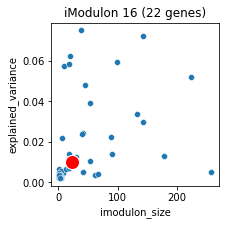

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS12110,0.209654,NaN,2710670,2710937,-1,GIY-YIG nuclease family protein,L,"Replication, recombination and repair",1361,EQU24_RS12115 // EQU24_RS12110,WP_026130003.1,||None,endonuclease activity\nnucleic acid phosphodie...,['endonuclease activity' 'nucleic acid phospho...
EQU24_RS01260,0.194258,NaN,254824,255316,1,hypothetical protein,X,No COG annotation,156,EQU24_RS01265 // EQU24_RS01260,WP_017841246.1,||None,NaN,[]
EQU24_RS01155,0.191475,NaN,234648,234873,1,hypothetical protein,X,No COG annotation,145,EQU24_RS01155,WP_083877732.1,||None,NaN,[]
EQU24_RS06295,0.188281,NaN,1377360,1377993,1,HTH domain-containing protein,K,Transcription,717,EQU24_RS06295,WP_017840301.1,||None,NaN,[]
EQU24_RS10700,0.188155,NaN,2380001,2380250,-1,hypothetical protein,X,No COG annotation,1201,EQU24_RS10700 // EQU24_RS10695,WP_026130026.1,||None,NaN,[]
EQU24_RS23055,0.180511,NaN,3846802,3846985,-1,BolA/IbaG family iron-sulfur metabolism protein,C,Energy production and conversion,1928,EQU24_RS23055 // EQU24_RS17115,WP_235726479.1,||None,NaN,[]
EQU24_RS16555,0.170958,NaN,3714628,3714988,-1,hypothetical protein,X,No COG annotation,1871,EQU24_RS16555 // EQU24_RS16550,WP_017842513.1,||None,NaN,[]
EQU24_RS10730,0.170089,NaN,2384250,2384430,-1,(4Fe-4S)-binding protein,S,Function unknown,1206,EQU24_RS10735 // EQU24_RS10730,WP_017839504.1,||None,NaN,[]
EQU24_RS17215,0.161585,NaN,3862286,3863567,-1,FprA family A-type flavoprotein,C,Energy production and conversion,1938,EQU24_RS17220 // EQU24_RS17215,WP_040575910.1,||None,FMN binding\nmetal ion binding\nelectron trans...,['FMN binding' 'metal ion binding' 'electron t...


In [228]:
imod_info(16)

In [229]:
ica_data.imodulon_table.loc[16,'function'] = 'unclear/outlier-response-wLa-vial_EW'


## iMod 17

iModulon 17


alt.LayerChart(...)

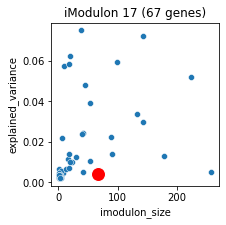

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS10945,0.216797,NaN,2443373,2443643,-1,PAAR domain-containing protein,T,Signal transduction mechanisms,1226,EQU24_RS10970 // EQU24_RS10965 // EQU24_RS1096...,WP_014148647.1,||None,NaN,[]
EQU24_RS11380,0.162705,NaN,2544773,2546354,1,IS66 family transposase,L,"Replication, recombination and repair",1276,EQU24_RS11380,WP_040575330.1,||None,NaN,[]
EQU24_RS16370,0.137275,NaN,3676994,3677465,-1,helix-turn-helix domain-containing protein,X,No COG annotation,1846,EQU24_RS16370 // EQU24_RS16365,WP_017842551.1,||None,DNA binding,['DNA binding']
EQU24_RS23010,0.117928,NaN,2664686,2665580,1,IS66 family transposase,L,"Replication, recombination and repair",2574,EQU24_RS23010,WP_244310882.1,||None,NaN,[]
EQU24_RS22460,0.113831,NaN,3274859,3275009,-1,hypothetical protein,X,No COG annotation,2535,EQU24_RS22460,WP_175421689.1,||None,NaN,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EQU24_RS22905,-0.078868,NaN,1352804,1353026,-1,hypothetical protein,X,No COG annotation,2567,EQU24_RS22905,WP_017840318.1,||None,NaN,[]
EQU24_RS09585,-0.079397,NaN,2129853,2130084,1,sulfurtransferase TusA family protein,O,"Post-translational modification, protein turno...",1089,EQU24_RS09585,WP_017839710.1,||None,transferase activity,['transferase activity']
EQU24_RS18860,-0.079531,NaN,4213623,4213699,-1,NaN,X,No COG annotation,2118,EQU24_RS18860,NaN,||,NaN,[]


In [230]:
imod_info(17)

In [231]:
ica_data.view_imodulon(17).sort_values('gene_weight',ascending=False).head(15)

,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS10945,0.216797,NaN,2443373,2443643,-1,PAAR domain-containing protein,T,Signal transduction mechanisms,1226,EQU24_RS10970 // EQU24_RS10965 // EQU24_RS1096...,WP_014148647.1,||None,NaN,[]
EQU24_RS11380,0.162705,NaN,2544773,2546354,1,IS66 family transposase,L,"Replication, recombination and repair",1276,EQU24_RS11380,WP_040575330.1,||None,NaN,[]
EQU24_RS16370,0.137275,NaN,3676994,3677465,-1,helix-turn-helix domain-containing protein,X,No COG annotation,1846,EQU24_RS16370 // EQU24_RS16365,WP_017842551.1,||None,DNA binding,['DNA binding']
EQU24_RS23010,0.117928,NaN,2664686,2665580,1,IS66 family transposase,L,"Replication, recombination and repair",2574,EQU24_RS23010,WP_244310882.1,||None,NaN,[]
EQU24_RS22460,0.113831,NaN,3274859,3275009,-1,hypothetical protein,X,No COG annotation,2535,EQU24_RS22460,WP_175421689.1,||None,NaN,[]
EQU24_RS03610,0.079630,ectA,774287,774782,1,diaminobutyrate acetyltransferase,K,Transcription,435,EQU24_RS03620 // ectB // ectA,WP_017840806.1,ectA||ectA,protein acetylation\nmonocarboxylic acid biosy...,['protein acetylation' 'monocarboxylic acid bi...
EQU24_RS06305,0.075986,NaN,1379493,1380189,1,cytochrome c3 family protein,S,Function unknown,718,EQU24_RS06310 // EQU24_RS06305 // EQU24_RS06300,WP_017840300.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS08240,0.072992,NaN,1811525,1811723,1,hypothetical protein,H,Coenzyme transport and metabolism,934,EQU24_RS08240,WP_017839938.1,||None,NaN,[]
EQU24_RS22570,0.071487,NaN,4233827,4233983,1,hypothetical protein,X,No COG annotation,2130,EQU24_RS22570 // lexA,WP_014149976.1,||None,NaN,[]


In [232]:
view_imod_weights_on_genome(ica_data,17)

alt.Chart(...)

In [233]:
ica_data.imodulon_table.loc[17,'function'] = 'unclear_EW'


## iMod 18

iModulon SG_3


alt.LayerChart(...)

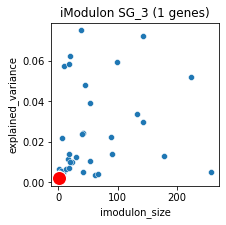

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS01150,0.477306,NaN,234038,234461,1,hypothetical protein,X,No COG annotation,144,EQU24_RS01150,WP_017841268.1,||None,NaN,[]


In [235]:
imod_info("SG_3")

In [237]:
view_imod_weights_on_genome(ica_data,"SG_3")

alt.Chart(...)

In [238]:
ica_data.imodulon_table.loc["SG_3",'function'] = 'sg-hypothetical_EW'


## iMod 19

iModulon 19


alt.LayerChart(...)

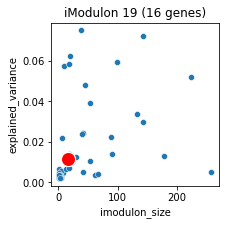

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS18860,0.319438,NaN,4213623,4213699,-1,NaN,X,No COG annotation,2118,EQU24_RS18860,NaN,||,NaN,[]
EQU24_RS07375,0.227582,NaN,1630411,1630488,1,NaN,X,No COG annotation,839,infC // thrS // EQU24_RS07375,NaN,||,NaN,[]
EQU24_RS05635,0.206651,NaN,1220732,1220808,1,NaN,X,No COG annotation,640,EQU24_RS05645 // EQU24_RS05640 // EQU24_RS0563...,NaN,||,NaN,[]
EQU24_RS10780,0.177724,NaN,2397391,2397468,-1,NaN,X,No COG annotation,1211,EQU24_RS10780,NaN,||,NaN,[]
EQU24_RS18555,0.155296,NaN,4143018,4143095,-1,NaN,X,No COG annotation,2082,EQU24_RS18555 // EQU24_RS18550 // EQU24_RS18545,NaN,||,NaN,[]
EQU24_RS15125,0.135721,NaN,3379487,3379572,-1,NaN,X,No COG annotation,1704,EQU24_RS15125,NaN,||,NaN,[]
EQU24_RS11380,0.128667,NaN,2544773,2546354,1,IS66 family transposase,L,"Replication, recombination and repair",1276,EQU24_RS11380,WP_040575330.1,||None,NaN,[]
EQU24_RS17510,0.112259,NaN,3912978,3913054,-1,NaN,X,No COG annotation,1969,EQU24_RS17510,NaN,||,NaN,[]
EQU24_RS12460,0.110106,NaN,2796194,2796281,1,NaN,X,No COG annotation,1402,EQU24_RS12460,NaN,||,NaN,[]


In [239]:
imod_info(19)

In [240]:
view_imod_weights_on_genome(ica_data,19)

alt.Chart(...)

In [244]:
ica_data.imodulon_table.loc[19,'function'] = 'low-in-Lanza/lowCH4|some-split_EW'


## iMod 20

iModulon 20


alt.LayerChart(...)

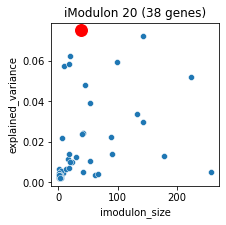

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name
13,20,NaN,6.410352e-13,1.358995e-10,0.236842,0.333333,0.276923,9.0,27.0,38.0,KEGG pathways,map00910,Nitrogen metabolism,NaN
11,20,NaN,6.935388e-07,8.114403e-05,0.078947,1.000000,0.146341,3.0,3.0,38.0,KEGG modules,M00438,NaN,NaN
12,20,NaN,6.935388e-07,8.114403e-05,0.078947,1.000000,0.146341,3.0,3.0,38.0,KEGG modules,M00530,NaN,"Dissimilatory nitrate reduction, nitrate => am..."
31,20,regulation of nitrogen utilization,1.361097e-05,2.911386e-02,0.078947,0.500000,0.136364,3.0,6.0,38.0,GO,NaN,NaN,NaN
15,20,NaN,1.943944e-04,1.696565e-02,0.131579,0.081967,0.101010,5.0,61.0,38.0,KEGG pathways,map02010,ABC transporters,NaN
32,20,ammonium transmembrane transport,8.048903e-05,3.443320e-02,0.052632,1.000000,0.100000,2.0,2.0,38.0,GO,NaN,NaN,NaN
33,20,ammonium transmembrane transporter activity,8.048903e-05,3.443320e-02,0.052632,1.000000,0.100000,2.0,2.0,38.0,GO,NaN,NaN,NaN
34,20,nitrate assimilation,8.048903e-05,3.443320e-02,0.052632,1.000000,0.100000,2.0,2.0,38.0,GO,NaN,NaN,NaN
35,20,nitrite reductase [NAD(P)H] activity,8.048903e-05,3.443320e-02,0.052632,1.000000,0.100000,2.0,2.0,38.0,GO,NaN,NaN,NaN
13,20,NaN,8.048903e-05,6.278144e-03,0.052632,1.000000,0.100000,2.0,2.0,38.0,KEGG modules,M00497,NaN,NaN


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS09010,0.138225,NaN,1991857,1992667,-1,formate/nitrite transporter family protein,P,Inorganic ion transport and metabolism,1022,EQU24_RS09010,WP_017839809.1,||None,integral component of membrane\ntransmembrane ...,['integral component of membrane' 'transmembra...
EQU24_RS12625,0.132242,NaN,2832638,2833655,1,ABC transporter permease,P,Inorganic ion transport and metabolism,1418,EQU24_RS12630 // EQU24_RS12625,WP_017839161.1,||None,plasma membrane\nintegral component of membran...,['plasma membrane' 'integral component of memb...
EQU24_RS12620,0.126958,NaN,2831096,2832494,1,ABC transporter substrate-binding protein,P,Inorganic ion transport and metabolism,1417,EQU24_RS12620,WP_014148744.1,||None,NaN,[]
EQU24_RS07180,0.124633,glnK,1573686,1574025,-1,P-II family nitrogen regulator,K,Transcription,819,glnK // EQU24_RS07175,WP_014147354.1,glnK||glnK,regulation of catalytic activity\nregulation o...,['regulation of catalytic activity' 'regulatio...
EQU24_RS02555,0.121834,NaN,543528,545553,1,cache domain-containing protein,N,Cell motility,318,EQU24_RS02555,WP_017841004.1,||None,NaN,[]
EQU24_RS07175,0.121462,NaN,1572406,1573663,-1,ammonium transporter,P,Inorganic ion transport and metabolism,819,glnK // EQU24_RS07175,WP_017840142.1,||None,ammonium transmembrane transporter activity\na...,['ammonium transmembrane transporter activity'...
EQU24_RS12630,0.119300,NaN,2833668,2835429,1,nitrate ABC transporter ATP-binding protein,P,Inorganic ion transport and metabolism,1418,EQU24_RS12630 // EQU24_RS12625,WP_017839160.1,||None,ATP hydrolysis activity\nnitrate transmembrane...,['ATP hydrolysis activity' 'nitrate transmembr...
EQU24_RS09005,0.110959,NaN,1990053,1991793,-1,bifunctional protein-serine/threonine kinase/p...,K,Transcription,1021,EQU24_RS09005 // cynS,WP_017839810.1,||None,protein phosphorylation\nATP binding\nprotein ...,['protein phosphorylation' 'ATP binding'\n 'pr...
EQU24_RS12635,0.105521,NaN,2835543,2836815,1,alginate export family protein,S,Function unknown,1419,EQU24_RS12635,WP_017839159.1,||None,NaN,[]


In [242]:
imod_info(20)

In [245]:
view_imod_weights_on_genome(ica_data,20)

alt.Chart(...)

In [246]:
ica_data.imodulon_table.loc[20,'function'] = 'nitrogen-related|ABC-transporters_EW'


## iMod 21

iModulon 21


alt.LayerChart(...)

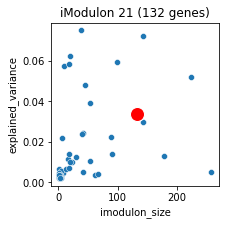

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name
16,21,NaN,1.795594e-16,3.806660e-14,0.128788,0.447368,0.200000,17.0,38.0,132.0,KEGG pathways,map02040,Flagellar assembly,NaN
38,21,bacterial-type flagellum-dependent cell motility,4.730425e-17,1.011838e-13,0.106061,0.666667,0.183007,14.0,21.0,132.0,GO,NaN,NaN,NaN
40,21,cytoskeletal motor activity,1.511818e-06,1.077926e-03,0.037879,0.625000,0.071429,5.0,8.0,132.0,GO,NaN,NaN,NaN
41,21,sulfate transmembrane transport,3.315503e-06,1.772965e-03,0.037879,0.555556,0.070922,5.0,9.0,132.0,GO,NaN,NaN,NaN
42,21,structural molecule activity,6.463282e-06,2.764992e-03,0.037879,0.500000,0.070423,5.0,10.0,132.0,GO,NaN,NaN,NaN
43,21,bacterial-type flagellum assembly,1.929941e-05,6.880239e-03,0.037879,0.416667,0.069444,5.0,12.0,132.0,GO,NaN,NaN,NaN
39,21,ABC-type sulfate transporter activity,9.512545e-07,1.017367e-03,0.030303,1.000000,0.058824,4.0,4.0,132.0,GO,NaN,NaN,NaN
14,21,NaN,9.512545e-07,2.225936e-04,0.030303,1.000000,0.058824,4.0,4.0,132.0,KEGG modules,M00185,NaN,NaN
44,21,"bacterial-type flagellum basal body, rod",3.080147e-05,9.412050e-03,0.022727,1.000000,0.044444,3.0,3.0,132.0,GO,NaN,NaN,NaN
15,21,NaN,9.899120e-04,7.721313e-02,0.015152,1.000000,0.029851,2.0,2.0,132.0,KEGG modules,M00511,NaN,NaN


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS16420,0.113299,NaN,3688342,3689980,1,hypothetical protein,X,No COG annotation,1855,EQU24_RS16420,WP_017842541.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS22610,0.112087,NaN,4528604,4535660,1,hypothetical protein,X,No COG annotation,2549,EQU24_RS22610,WP_175421711.1,||None,NaN,[]
EQU24_RS16415,0.111581,NaN,3687181,3688282,1,hypothetical protein,X,No COG annotation,1854,EQU24_RS16415,WP_017842542.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS02085,0.110979,NaN,442165,444001,1,S8 family serine peptidase,O,"Post-translational modification, protein turno...",262,EQU24_RS02085,WP_017841089.1,||None,serine-type endopeptidase activity\nproteolysis,['serine-type endopeptidase activity' 'proteol...
EQU24_RS02090,0.109565,NaN,444113,445019,-1,transposase,L,"Replication, recombination and repair",263,EQU24_RS02090,WP_083877721.1,||None,transposase activity\nDNA binding\ntranspositi...,['transposase activity' 'DNA binding' 'transpo...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EQU24_RS03580,-0.062638,NaN,767309,768908,1,SulP family inorganic anion transporter,P,Inorganic ion transport and metabolism,430,EQU24_RS03580,WP_175421657.1,||None,sulfate transmembrane transport\nsecondary act...,['sulfate transmembrane transport'\n 'secondar...
EQU24_RS20770,-0.065347,NaN,4678204,4678435,-1,hypothetical protein,X,No COG annotation,2333,EQU24_RS20775 // EQU24_RS20770,WP_017841721.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS22495,-0.069767,NaN,3592689,3592968,-1,hypothetical protein,X,No COG annotation,1804,EQU24_RS16000 // EQU24_RS15995 // EQU24_RS2250...,WP_175421697.1,||None,NaN,[]


In [247]:
imod_info(21)

In [248]:
ica_data.imodulon_table.loc[21,'function'] = 'sulfate-and-flagella?_EW'


## iMod 22

iModulon SG_4


alt.LayerChart(...)

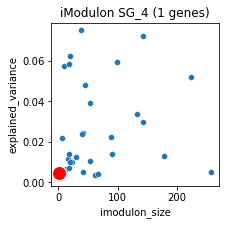

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS22315,0.730087,NaN,1652026,1652173,1,hypothetical protein,X,No COG annotation,851,EQU24_RS07495 // EQU24_RS07490 // EQU24_RS22315,WP_017840089.1,||None,NaN,[]


In [250]:
imod_info("SG_4")

In [251]:
ica_data.imodulon_table.loc["SG_4",'function'] = 'sg-hypothetical_EW'


## iMod 23

iModulon 23


alt.LayerChart(...)

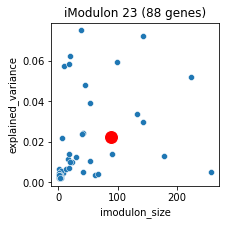

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS05645,0.121491,NaN,1220955,1221031,1,NaN,X,No COG annotation,640,EQU24_RS05645 // EQU24_RS05640 // EQU24_RS0563...,NaN,||,NaN,[]
EQU24_RS17700,0.114155,NaN,3952860,3954441,-1,IS66 family transposase,L,"Replication, recombination and repair",1988,EQU24_RS17700,WP_040575330.1,||None,NaN,[]
EQU24_RS18850,0.101321,NaN,4211675,4211752,-1,NaN,X,No COG annotation,2117,EQU24_RS18855 // EQU24_RS18850 // EQU24_RS18845,NaN,||,NaN,[]
EQU24_RS00630,0.100492,NaN,131271,131348,1,NaN,X,No COG annotation,76,EQU24_RS00635 // EQU24_RS00630,NaN,||,NaN,[]
EQU24_RS02740,0.099928,NaN,590142,590219,1,NaN,X,No COG annotation,341,EQU24_RS02745 // EQU24_RS02740 // EQU24_RS0273...,NaN,||,NaN,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EQU24_RS17000,-0.060598,NaN,3818982,3819207,-1,DUF4266 domain-containing protein,S,Function unknown,1915,EQU24_RS17000 // EQU24_RS16995,WP_083877869.1,||None,membrane,['membrane']
EQU24_RS22435,-0.066851,NaN,3079987,3080152,-1,hypothetical protein,X,No COG annotation,2531,EQU24_RS22435,WP_175421644.1,||None,NaN,[]
EQU24_RS07955,-0.067472,NaN,1758597,1758689,1,NaN,X,No COG annotation,898,EQU24_RS07965 // EQU24_RS07960 // EQU24_RS0795...,NaN,||,NaN,[]


In [252]:
imod_info(23)

In [255]:
#view_imod_weights_on_genome(ica_data,23)

In [259]:
ica_data.imodulon_table.loc[23,'function'] = 'new-up-inCH4lim/MeOH_EW'


## iMod 24

iModulon SG_5


alt.LayerChart(...)

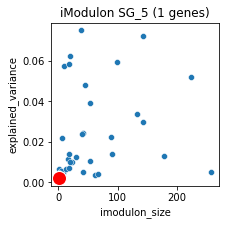

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS10960,0.65772,NaN,2446125,2446314,-1,DUF5908 family protein,X,No COG annotation,1226,EQU24_RS10970 // EQU24_RS10965 // EQU24_RS1096...,WP_017839463.1,||None,NaN,[]


In [257]:
imod_info("SG_5")

In [258]:
view_imod_weights_on_genome(ica_data,'SG_5')

alt.Chart(...)

In [260]:
ica_data.imodulon_table.loc["SG_5",'function'] = 'sg-DUF_EW'


## iMod 25

iModulon 25


alt.LayerChart(...)

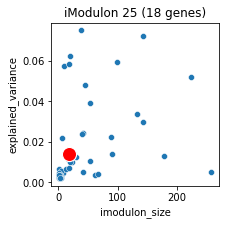

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name
45,25,protein folding,4.532185e-11,9.694343e-08,0.333333,0.333333,0.333333,6.0,18.0,18.0,GO,NaN,NaN,NaN
46,25,unfolded protein binding,1.018043e-09,1.088797e-06,0.277778,0.384615,0.322581,5.0,13.0,18.0,GO,NaN,NaN,NaN
47,25,protein refolding,2.676166e-07,1.908106e-04,0.166667,0.750000,0.272727,3.0,4.0,18.0,GO,NaN,NaN,NaN
17,25,NaN,1.330885e-06,2.462142e-04,0.166667,0.500000,0.250000,3.0,6.0,18.0,KEGG pathways,map04212,Longevity regulating pathway - worm,NaN
18,25,NaN,2.322775e-06,2.462142e-04,0.166667,0.428571,0.240000,3.0,7.0,18.0,KEGG pathways,map05152,Tuberculosis,NaN
19,25,NaN,1.751753e-05,9.284289e-04,0.111111,1.000000,0.200000,2.0,2.0,18.0,KEGG pathways,map04141,Protein processing in endoplasmic reticulum,NaN
20,25,NaN,1.751753e-05,9.284289e-04,0.111111,1.000000,0.200000,2.0,2.0,18.0,KEGG pathways,map04940,Type I diabetes mellitus,NaN
50,25,response to heat,1.045692e-04,3.727892e-02,0.111111,0.500000,0.181818,2.0,4.0,18.0,GO,NaN,NaN,NaN
21,25,NaN,6.225959e-05,2.639807e-03,0.166667,0.157895,0.162162,3.0,19.0,18.0,KEGG pathways,map03018,RNA degradation,NaN
22,25,NaN,3.631973e-04,1.283297e-02,0.111111,0.285714,0.160000,2.0,7.0,18.0,KEGG pathways,map05134,Legionellosis,NaN


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS08650,0.251766,groS,1915795,1916083,1,co-chaperone GroES,O,"Post-translational modification, protein turno...",981,groES,WP_017839870.1,groES||groES,ATP binding\ncytoplasm\nprotein folding,['ATP binding' 'cytoplasm' 'protein folding']
EQU24_RS08655,0.250103,groL,1916139,1917798,1,chaperonin GroEL,O,"Post-translational modification, protein turno...",982,groL,WP_017839869.1,groL||groL,ATP binding\nunfolded protein binding\nprotein...,['ATP binding' 'unfolded protein binding' 'pro...
EQU24_RS17880,0.186383,htpG,3997666,3999586,1,molecular chaperone HtpG,O,"Post-translational modification, protein turno...",2003,htpG,WP_017842253.1,htpG||htpG,ATP binding\nunfolded protein binding\ncytopla...,['ATP binding' 'unfolded protein binding' 'cyt...
EQU24_RS17825,0.182390,groS,3982853,3983144,-1,co-chaperone GroES,O,"Post-translational modification, protein turno...",1996,groES // groL,WP_017842265.1,groES||groES,ATP binding\ncytoplasm\nprotein folding,['ATP binding' 'cytoplasm' 'protein folding']
EQU24_RS08660,0.165171,NaN,1917885,1918140,1,Rho-binding antiterminator,K,Transcription,983,EQU24_RS08660,WP_017839868.1,||None,NaN,[]
EQU24_RS17820,0.162970,groL,3981192,3982815,-1,chaperonin GroEL,O,"Post-translational modification, protein turno...",1996,groES // groL,WP_017842266.1,groL||groL,ATP binding\nunfolded protein binding\nprotein...,['ATP binding' 'unfolded protein binding' 'pro...
EQU24_RS11545,0.155246,dnaK,2579645,2581580,-1,molecular chaperone DnaK,O,"Post-translational modification, protein turno...",1297,dnaK // dnaJ // dapB,WP_017839358.1,dnaK||dnaK,ATP binding\nunfolded protein binding\nprotein...,['ATP binding' 'unfolded protein binding' 'pro...
EQU24_RS11550,0.147410,grpE,2581650,2582298,-1,nucleotide exchange factor GrpE,O,"Post-translational modification, protein turno...",1298,grpE,WP_017839357.1,grpE||grpE,protein homodimerization activity\nregulation ...,['protein homodimerization activity' 'regulati...
EQU24_RS08645,0.144918,moeB,1914913,1915657,-1,molybdopterin-synthase adenylyltransferase MoeB,H,Coenzyme transport and metabolism,980,moeB,WP_017839871.1,moeB||moeB,nucleotidyltransferase activity\nubiquitin-lik...,['nucleotidyltransferase activity'\n 'ubiquiti...


In [261]:
imod_info(25)

In [262]:
ica_data.imodulon_table.loc[25,'function'] = 'groEL/ES-post-translation-mod_EW'


## iMod 26

iModulon 26


alt.LayerChart(...)

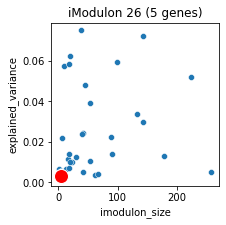

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS22950,0.352533,NaN,2335828,2336020,1,hypothetical protein,X,No COG annotation,2570,EQU24_RS22950,WP_017839550.1,||None,NaN,[]
EQU24_RS14765,0.312213,NaN,3301430,3301946,1,hypothetical protein,S,Function unknown,1664,EQU24_RS14765 // EQU24_RS14760,WP_017838761.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS22585,0.248323,NaN,4420667,4420814,1,hypothetical protein,X,No COG annotation,2545,EQU24_RS22585,WP_017841924.1,||None,NaN,[]
EQU24_RS11380,-0.176404,NaN,2544773,2546354,1,IS66 family transposase,L,"Replication, recombination and repair",1276,EQU24_RS11380,WP_040575330.1,||None,NaN,[]
EQU24_RS22495,-0.271791,NaN,3592689,3592968,-1,hypothetical protein,X,No COG annotation,1804,EQU24_RS16000 // EQU24_RS15995 // EQU24_RS2250...,WP_175421697.1,||None,NaN,[]


In [263]:
imod_info(26)

In [264]:
ica_data.imodulon_table.loc[26,'function'] = 'unclear/outlier-response-FM19_TR3_QC_EW'


## iMod 27

iModulon SG_6


alt.LayerChart(...)

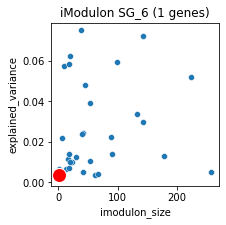

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS22460,0.666885,NaN,3274859,3275009,-1,hypothetical protein,X,No COG annotation,2535,EQU24_RS22460,WP_175421689.1,||None,NaN,[]


In [266]:
imod_info("SG_6")

In [320]:
ica_data.imodulon_table.loc["SG_6",'function'] = 'sg-hypothetical'


## iMod 28

iModulon 28


alt.LayerChart(...)

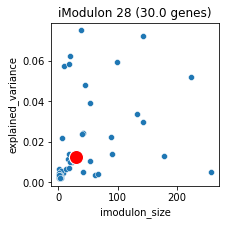

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name
17,28,NaN,3.337799e-07,0.000078,0.100000,1.000000,0.181818,3.0,3.0,30.0,KEGG modules,M00641,NaN,"Multidrug resistance, efflux pump MexEF-OprN"
30,28,NaN,1.343969e-04,0.028492,0.133333,0.105263,0.117647,4.0,38.0,30.0,KEGG pathways,map02040,Flagellar assembly,NaN
31,28,NaN,2.961646e-04,0.031393,0.066667,0.500000,0.117647,2.0,4.0,30.0,KEGG pathways,map00909,Sesquiterpenoid and triterpenoid biosynthesis,NaN
18,28,NaN,7.338165e-04,0.085857,0.066667,0.333333,0.111111,2.0,6.0,30.0,KEGG modules,M00155,NaN,"Cytochrome c oxidase, prokaryotes"


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS14125,0.305667,ctaD,3155695,3157312,-1,cytochrome c oxidase subunit I,C,Energy production and conversion,1585,coxB // ctaD,WP_017838879.1,ctaD||ctaD,electron transport coupled proton transport\na...,['electron transport coupled proton transport'...
EQU24_RS14130,0.213469,coxB,3157364,3158534,-1,cytochrome c oxidase subunit II,C,Energy production and conversion,1585,coxB // ctaD,WP_017838878.1,coxB||coxB,proton transmembrane transport\ncopper ion bin...,['proton transmembrane transport' 'copper ion ...
EQU24_RS23090,0.130608,NaN,3946386,3947091,-1,flagellin,N,Cell motility,2581,EQU24_RS23090,WP_235726477.1,||None,NaN,[]
EQU24_RS10825,0.119810,NaN,2405627,2408813,1,multidrug efflux RND transporter permease subunit,V,Defense mechanisms,1219,EQU24_RS10830 // EQU24_RS10825 // EQU24_RS10820,WP_017839487.1,||None,xenobiotic transport\nefflux transmembrane tra...,['xenobiotic transport' 'efflux transmembrane ...
EQU24_RS17660,0.110446,fliS,3937926,3938310,-1,flagellar export chaperone FliS,N,Cell motility,1983,fliS // EQU24_RS17655,WP_026130345.1,fliS||fliS,bacterial-type flagellum assembly\ncytosol,['bacterial-type flagellum assembly' 'cytosol']
EQU24_RS17655,0.110235,NaN,3937605,3937923,-1,hypothetical protein,X,No COG annotation,1983,fliS // EQU24_RS17655,WP_017842303.1,||None,NaN,[]
EQU24_RS17680,0.110026,fliD,3943848,3945858,-1,flagellar filament capping protein FliD,N,Cell motility,1986,EQU24_RS17685 // fliD,WP_017842296.1,fliD||fliD,bacterial-type flagellum-dependent cell motili...,['bacterial-type flagellum-dependent cell moti...
EQU24_RS10820,0.108762,NaN,2404406,2405621,1,efflux RND transporter periplasmic adaptor sub...,M,Cell wall/membrane/envelope biogenesis,1219,EQU24_RS10830 // EQU24_RS10825 // EQU24_RS10820,WP_017839488.1,||None,transmembrane transport\ntransmembrane transpo...,['transmembrane transport' 'transmembrane tran...
EQU24_RS01595,0.104476,NaN,335395,335581,-1,YjfB family protein,X,No COG annotation,198,EQU24_RS01595,WP_017841184.1,||None,phosphorylation\nkinase activity,['phosphorylation' 'kinase activity']


In [268]:
imod_info(28)

In [269]:
ica_data.imodulon_table.loc[28,'function'] = 'multi-drug-resistance/transport/efflux-pump/low-activity-aa3KO_EW'


## iMod 29

iModulon 29


alt.LayerChart(...)

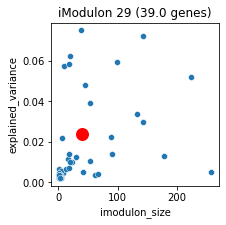

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS14140,0.324084,NaN,3159266,3159662,-1,bacteriohemerythrin,P,Inorganic ion transport and metabolism,1586,EQU24_RS14140,WP_014148778.1,||None,metal ion binding,['metal ion binding']
EQU24_RS03040,0.209046,NaN,653037,653427,-1,hypothetical protein,X,No COG annotation,375,EQU24_RS03040,WP_017840915.1,||None,NaN,[]
EQU24_RS00305,0.112791,NaN,67787,68192,1,response regulator,T,Signal transduction mechanisms,38,EQU24_RS00310 // EQU24_RS00305 // EQU24_RS00300,WP_014146573.1,||None,phosphorelay signal transduction system,['phosphorelay signal transduction system']
EQU24_RS03035,0.106101,yidD,652553,652808,1,membrane protein insertion efficiency factor YidD,S,Function unknown,374,yidD,WP_175421656.1,yidD||yidD,plasma membrane,['plasma membrane']
EQU24_RS06680,0.088636,NaN,1467927,1468572,1,hypothetical protein,X,No COG annotation,764,EQU24_RS06680 // EQU24_RS06675 // EQU24_RS0667...,WP_017840234.1,||None,NaN,[]
EQU24_RS06675,0.087170,NaN,1467389,1467926,1,ATP/GTP-binding protein,S,Function unknown,764,EQU24_RS06680 // EQU24_RS06675 // EQU24_RS0667...,WP_017840235.1,||None,NaN,[]
EQU24_RS17065,0.083452,nifH,3837050,3837932,1,nitrogenase iron protein,P,Inorganic ion transport and metabolism,1926,EQU24_RS17100 // EQU24_RS17095 // EQU24_RS1709...,WP_017842415.1,nifH||nifH,carbonyl sulfide nitrogenase activity\nATP bin...,['carbonyl sulfide nitrogenase activity' 'ATP ...
EQU24_RS06685,0.082332,NaN,1468953,1469316,1,roadblock/LC7 domain-containing protein,S,Function unknown,765,EQU24_RS06695 // EQU24_RS06690 // EQU24_RS06685,WP_017840233.1,||None,positive regulation of TOR signaling\nguanyl-n...,['positive regulation of TOR signaling'\n 'gua...
EQU24_RS17270,0.080912,nifL,3872554,3874195,1,nitrogen fixation negative regulator NifL,K,Transcription,1945,nifA // nifL,WP_235726433.1,nifL||nifL,peptidyl-histidine phosphorylation\nATP bindin...,['peptidyl-histidine phosphorylation' 'ATP bin...


In [270]:
imod_info(29)

In [271]:
view_imod_weights_on_genome(ica_data,29)

alt.Chart(...)

In [272]:
ica_data.imodulon_table.loc[29,'function'] = 'transport/signal-transduction/anti-FES_EW'


## iMod 30

iModulon 30


alt.LayerChart(...)

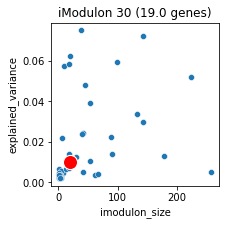

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name
19,30,NaN,7.966324e-08,0.000019,0.157895,1.000000,0.272727,3.0,3.0,19.0,KEGG modules,M00641,NaN,"Multidrug resistance, efflux pump MexEF-OprN"
51,30,efflux transmembrane transporter activity,2.126023e-07,0.000455,0.210526,0.307692,0.250000,4.0,13.0,19.0,GO,NaN,NaN,NaN
52,30,transmembrane transport,4.291851e-07,0.000459,0.368421,0.059829,0.102941,7.0,117.0,19.0,GO,NaN,NaN,NaN


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS10730,0.186277,NaN,2384250,2384430,-1,(4Fe-4S)-binding protein,S,Function unknown,1206,EQU24_RS10735 // EQU24_RS10730,WP_017839504.1,||None,NaN,[]
EQU24_RS10735,0.186125,NaN,2384435,2384720,-1,DUF4242 domain-containing protein,S,Function unknown,1206,EQU24_RS10735 // EQU24_RS10730,WP_017839503.1,||None,NaN,[]
EQU24_RS10825,0.150950,NaN,2405627,2408813,1,multidrug efflux RND transporter permease subunit,V,Defense mechanisms,1219,EQU24_RS10830 // EQU24_RS10825 // EQU24_RS10820,WP_017839487.1,||None,xenobiotic transport\nefflux transmembrane tra...,['xenobiotic transport' 'efflux transmembrane ...
EQU24_RS10820,0.149834,NaN,2404406,2405621,1,efflux RND transporter periplasmic adaptor sub...,M,Cell wall/membrane/envelope biogenesis,1219,EQU24_RS10830 // EQU24_RS10825 // EQU24_RS10820,WP_017839488.1,||None,transmembrane transport\ntransmembrane transpo...,['transmembrane transport' 'transmembrane tran...
EQU24_RS10740,0.149215,NaN,2384845,2385241,-1,rhodanese-like domain-containing protein,P,Inorganic ion transport and metabolism,1207,EQU24_RS10740,WP_017839502.1,||None,NaN,[]
EQU24_RS10725,0.132722,NaN,2382953,2384153,-1,NAD(P)/FAD-dependent oxidoreductase,S,Function unknown,1205,EQU24_RS10725 // EQU24_RS10720,WP_017839505.1,||None,oxidoreductase activity\n,['oxidoreductase activity' '']
EQU24_RS09210,0.129383,NaN,2039933,2040548,-1,TetR/AcrR family transcriptional regulator,K,Transcription,1043,EQU24_RS09210 // EQU24_RS09205,WP_017839779.1,||None,DNA binding,['DNA binding']
EQU24_RS10830,0.126284,NaN,2408809,2410279,1,efflux transporter outer membrane subunit,M,Cell wall/membrane/envelope biogenesis,1219,EQU24_RS10830 // EQU24_RS10825 // EQU24_RS10820,WP_017839486.1,||None,cell outer membrane\nefflux transmembrane tran...,['cell outer membrane' 'efflux transmembrane t...
EQU24_RS00680,0.125755,NaN,142316,143624,-1,selenium-binding family protein,S,Function unknown,80,EQU24_RS00680,WP_235726469.1,||None,selenium binding,['selenium binding']


In [273]:
imod_info(30)

In [274]:
ica_data.imodulon_table.loc[30,'function'] = 'multi-drug-resistance/TetR/membrane-transport_EW'


## iMod 31

iModulon 31


alt.LayerChart(...)

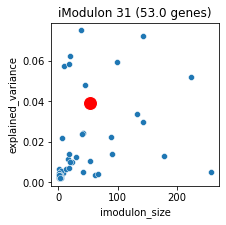

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name
53,31,nitrogen fixation,1.272941e-24,2.722820e-21,0.264151,0.777778,0.394366,14.0,18.0,53.0,GO,NaN,NaN,NaN
55,31,electron transport chain,7.752281e-10,5.527376e-07,0.207547,0.152778,0.176000,11.0,72.0,53.0,GO,NaN,NaN,NaN
54,31,nitrogenase activity,2.705038e-10,2.893038e-07,0.094340,1.000000,0.172414,5.0,5.0,53.0,GO,NaN,NaN,NaN
57,31,electron transfer activity,4.565868e-07,1.953278e-04,0.150943,0.137931,0.144144,8.0,58.0,53.0,GO,NaN,NaN,NaN
58,31,iron-sulfur cluster binding,1.796797e-06,6.405582e-04,0.113208,0.193548,0.142857,6.0,31.0,53.0,GO,NaN,NaN,NaN
56,31,carbonyl sulfide nitrogenase activity,2.305355e-08,1.232789e-05,0.075472,1.000000,0.140351,4.0,4.0,53.0,GO,NaN,NaN,NaN
20,31,NaN,1.925894e-06,4.506591e-04,0.056604,1.000000,0.107143,3.0,3.0,53.0,KEGG modules,M00175,NaN,"Nitrogen fixation, nitrogen => ammonia"
32,31,NaN,1.891476e-05,4.009928e-03,0.056604,0.600000,0.103448,3.0,5.0,53.0,KEGG pathways,map00625,Chloroalkane and chloroalkene degradation,NaN
59,31,molybdenum-iron nitrogenase complex,1.577722e-04,4.821069e-02,0.037736,1.000000,0.072727,2.0,2.0,53.0,GO,NaN,NaN,NaN


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS17085,0.180642,NaN,3841557,3841758,1,4Fe-4S binding protein,C,Energy production and conversion,1926,EQU24_RS17100 // EQU24_RS17095 // EQU24_RS1709...,WP_017842411.1,||None,NaN,[]
EQU24_RS17070,0.173745,nifD,3838069,3839548,1,nitrogenase molybdenum-iron protein alpha chain,C,Energy production and conversion,1926,EQU24_RS17100 // EQU24_RS17095 // EQU24_RS1709...,WP_017842414.1,nifD||nifD,carbonyl sulfide nitrogenase activity\nnitroge...,['carbonyl sulfide nitrogenase activity' 'nitr...
EQU24_RS17075,0.168233,nifK,3839690,3841262,1,nitrogenase molybdenum-iron protein subunit beta,F,Nucleotide transport and metabolism,1926,EQU24_RS17100 // EQU24_RS17095 // EQU24_RS1709...,WP_017842413.1,nifK||nifK,ATP binding\nnitrogenase activity\ncarbonyl su...,['ATP binding' 'nitrogenase activity'\n 'carbo...
EQU24_RS17065,0.167767,nifH,3837050,3837932,1,nitrogenase iron protein,P,Inorganic ion transport and metabolism,1926,EQU24_RS17100 // EQU24_RS17095 // EQU24_RS1709...,WP_017842415.1,nifH||nifH,carbonyl sulfide nitrogenase activity\nATP bin...,['carbonyl sulfide nitrogenase activity' 'ATP ...
EQU24_RS17080,0.162422,nifT,3841334,3841547,1,putative nitrogen fixation protein NifT,Q,"Secondary metabolites biosynthesis, transport,...",1926,EQU24_RS17100 // EQU24_RS17095 // EQU24_RS1709...,WP_017842412.1,nifT||nifT,nitrogen fixation,['nitrogen fixation']
EQU24_RS17230,0.157517,nifB,3864394,3865885,-1,nitrogenase cofactor biosynthesis protein NifB,C,Energy production and conversion,1940,nifB,WP_017842383.1,nifB||nifB,"metal ion binding\n4 iron, 4 sulfur cluster bi...","['metal ion binding' '4 iron, 4 sulfur cluster..."
EQU24_RS17205,0.151916,NaN,3861500,3861851,-1,2Fe-2S iron-sulfur cluster binding domain-cont...,C,Energy production and conversion,1937,EQU24_RS17210 // EQU24_RS17205 // EQU24_RS17200,WP_017842388.1,||None,"2 iron, 2 sulfur cluster binding\nelectron tra...","['2 iron, 2 sulfur cluster binding' 'electron ..."
EQU24_RS17325,0.149679,NaN,3883622,3884123,-1,hypothetical protein,S,Function unknown,1950,EQU24_RS17330 // EQU24_RS17325,WP_017842362.1,||None,NaN,[]
EQU24_RS17200,0.148080,NaN,3860895,3861501,-1,nitrogen fixation protein NifQ,S,Function unknown,1937,EQU24_RS17210 // EQU24_RS17205 // EQU24_RS17200,WP_017842389.1,||None,molybdenum ion binding\nnitrogen fixation,['molybdenum ion binding' 'nitrogen fixation']


In [276]:
imod_info(31)

In [277]:
ica_data.imodulon_table.loc[31,'function'] = 'nif/electron-transport_EW'


## iMod 32

iModulon SG_7


alt.LayerChart(...)

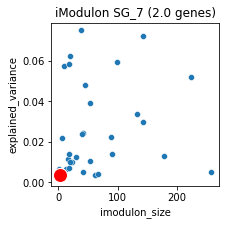

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS12140,0.606803,cas2,2713901,2714186,-1,CRISPR-associated endonuclease Cas2,L,"Replication, recombination and repair",1363,cas2 // cas1 // EQU24_RS12130 // cas2,WP_017839245.1,cas2||cas2,"RNA phosphodiester bond hydrolysis, endonucleo...","['RNA phosphodiester bond hydrolysis, endonucl..."
EQU24_RS22515,-0.286828,NaN,3885805,3885958,-1,hypothetical protein,X,No COG annotation,1951,nifV // EQU24_RS22515 // cysE // EQU24_RS17335,WP_017842358.1,||None,NaN,[]


In [279]:
imod_info("SG_7")

In [319]:
ica_data.imodulon_table.loc["SG_7",'function'] = 'sg-cas2_EW'


## iMod 33

iModulon SG_8


alt.LayerChart(...)

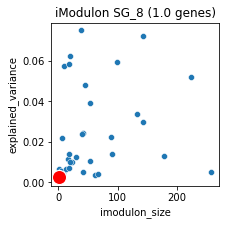

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS23065,0.599443,NaN,3883242,3883440,-1,hypothetical protein,X,No COG annotation,1949,EQU24_RS23065 // EQU24_RS17315 // EQU24_RS1731...,WP_017842364.1,||None,NaN,[]


In [282]:
imod_info('SG_8')

In [283]:
ica_data.imodulon_table.loc["SG_8",'function'] = 'sg-hypothetical_EW'


## iMod 34

iModulon 34


alt.LayerChart(...)

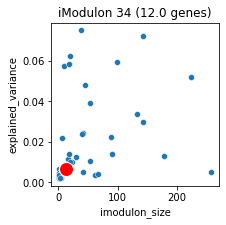

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name
21,34,NaN,0.000023,0.005296,0.166667,0.666667,0.266667,2.0,3.0,12.0,KEGG modules,M00240,NaN,NaN


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS20575,0.271399,NaN,4637283,4639062,-1,hypothetical protein,G,Carbohydrate transport and metabolism,2309,EQU24_RS20575,WP_017841756.1,||None,protein binding\nmembrane,['protein binding' 'membrane']
EQU24_RS20585,0.252914,NaN,4639491,4641876,-1,TonB-dependent hemoglobin/transferrin/lactofer...,P,Inorganic ion transport and metabolism,2310,EQU24_RS20590 // EQU24_RS20585 // EQU24_RS20580,WP_017841754.1,||None,heme transport\ncell outer membrane\nintegral ...,['heme transport' 'cell outer membrane' 'integ...
EQU24_RS20560,0.251033,NaN,4635443,4636445,-1,hemin-degrading factor,P,Inorganic ion transport and metabolism,2308,EQU24_RS20565 // EQU24_RS20560,WP_051056252.1,||None,iron ion transport,['iron ion transport']
EQU24_RS20555,0.246844,NaN,4634454,4635003,-1,pyridoxamine 5'-phosphate oxidase family protein,P,Inorganic ion transport and metabolism,2307,EQU24_RS20555,WP_017841760.1,||None,NaN,['']
EQU24_RS20590,0.246401,NaN,4641915,4642194,-1,hypothetical protein,X,No COG annotation,2310,EQU24_RS20590 // EQU24_RS20585 // EQU24_RS20580,WP_014150183.1,||None,NaN,[]
EQU24_RS20580,0.236659,NaN,4639230,4639482,-1,pilus assembly protein,X,No COG annotation,2310,EQU24_RS20590 // EQU24_RS20585 // EQU24_RS20580,WP_201764870.1,||None,NaN,[]
EQU24_RS20565,0.231985,NaN,4636447,4636726,-1,hypothetical protein,X,No COG annotation,2308,EQU24_RS20565 // EQU24_RS20560,WP_017841758.1,||None,NaN,[]
EQU24_RS20550,0.226969,NaN,4633246,4634119,-1,ABC transporter substrate-binding protein,P,Inorganic ion transport and metabolism,2306,EQU24_RS20550 // EQU24_RS20545 // EQU24_RS20540,WP_017841761.1,||None,NaN,[]
EQU24_RS19160,0.177576,NaN,4283255,4285547,-1,TonB-dependent receptor,P,Inorganic ion transport and metabolism,2151,EQU24_RS19160,WP_017842024.1,||None,cell outer membrane\nintegral component of mem...,['cell outer membrane' 'integral component of ...


In [284]:
imod_info(34)

In [285]:
view_imod_weights_on_genome(ica_data,34)

alt.Chart(...)

In [286]:
ica_data.imodulon_table.loc[34,'function'] = 'ion-transport/outlier-repsonse-FM11_EW'


## iMod 35

iModulon 35


alt.LayerChart(...)

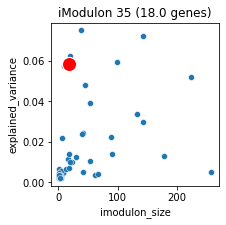

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS17700,0.137488,NaN,3952860,3954441,-1,IS66 family transposase,L,"Replication, recombination and repair",1988,EQU24_RS17700,WP_040575330.1,||None,NaN,[]
EQU24_RS16560,0.096145,NaN,3715697,3717278,-1,IS66 family transposase,L,"Replication, recombination and repair",1872,EQU24_RS16560,WP_040575330.1,||None,NaN,[]
EQU24_RS02970,-0.089923,pqqA,634777,634852,-1,pyrroloquinoline quinone precursor peptide PqqA,X,No COG annotation,362,pqqA // pqqB // pqqC // EQU24_RS02955,WP_006892363.1,pqqA||pqqA,pyrroloquinoline quinone biosynthetic process,['pyrroloquinoline quinone biosynthetic process']
EQU24_RS18555,-0.099310,NaN,4143018,4143095,-1,NaN,X,No COG annotation,2082,EQU24_RS18555 // EQU24_RS18550 // EQU24_RS18545,NaN,||,NaN,[]
EQU24_RS16575,-0.099825,NaN,3719991,3720067,-1,NaN,X,No COG annotation,1875,EQU24_RS16575,NaN,||,NaN,[]
EQU24_RS20650,-0.100341,NaN,4658178,4658265,1,NaN,X,No COG annotation,2318,EQU24_RS20650,NaN,||,NaN,[]
EQU24_RS05635,-0.117907,NaN,1220732,1220808,1,NaN,X,No COG annotation,640,EQU24_RS05645 // EQU24_RS05640 // EQU24_RS0563...,NaN,||,NaN,[]
EQU24_RS03795,-0.120298,NaN,810653,810729,1,NaN,X,No COG annotation,451,nusG // secE // EQU24_RS03805 // tuf // EQU24_...,NaN,||,NaN,[]
EQU24_RS03790,-0.120682,NaN,810562,810636,1,NaN,X,No COG annotation,451,nusG // secE // EQU24_RS03805 // tuf // EQU24_...,NaN,||,NaN,[]


In [287]:
imod_info(35)

In [288]:
view_imod_weights_on_genome(ica_data,35)

alt.Chart(...)

In [289]:
ica_data.imodulon_table.loc[35,'function'] = 'up-in-Lavials/limCH4|transposae|anti-pqqa_EW'


## iMod 36

iModulon 36


alt.LayerChart(...)

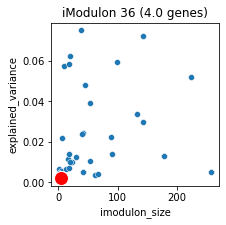

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS00075,0.288026,tatB,19487,19799,1,Sec-independent protein translocase protein TatB,U,"Intracellular trafficking, secretion, and vesi...",7,tatB // tatA,WP_017841462.1,tatB||tatB,TAT protein transport complex\nintegral compon...,['TAT protein transport complex' 'integral com...
EQU24_RS10965,0.121638,NaN,2446321,2446762,-1,phage tail protein,S,Function unknown,1226,EQU24_RS10970 // EQU24_RS10965 // EQU24_RS1096...,WP_014148651.1,||None,acyltransferase activity\nstructural molecule ...,['acyltransferase activity' 'structural molecu...
EQU24_RS22585,-0.179025,NaN,4420667,4420814,1,hypothetical protein,X,No COG annotation,2545,EQU24_RS22585,WP_017841924.1,||None,NaN,[]
EQU24_RS16380,-0.201157,NaN,3678261,3678483,-1,hypothetical protein,X,No COG annotation,1848,EQU24_RS16380,WP_017842548.1,||None,NaN,[]


In [290]:
imod_info(36)

In [291]:
ica_data.imodulon_table.loc[36,'function'] = 'small_unclear_EW'

## iMod 37

iModulon 37


alt.LayerChart(...)

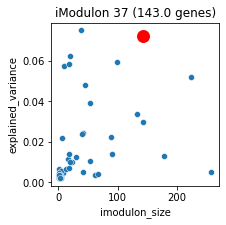

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name
60,37,cobalamin biosynthetic process,1.328640e-12,2.841962e-09,0.076923,0.611111,0.136646,11.0,18.0,143.0,GO,NaN,NaN,NaN
33,37,NaN,4.659974e-10,9.879145e-08,0.083916,0.352941,0.135593,12.0,34.0,143.0,KEGG pathways,map00860,Porphyrin metabolism,NaN
34,37,NaN,4.396142e-04,4.659910e-02,0.062937,0.132353,0.085308,9.0,68.0,143.0,KEGG pathways,map02030,Bacterial chemotaxis,NaN


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS09835,0.105464,NaN,2185369,2185443,1,NaN,X,No COG annotation,1113,EQU24_RS09835 // EQU24_RS09830 // EQU24_RS09825,NaN,||,NaN,[]
EQU24_RS12015,0.102822,cobM,2685659,2686454,1,precorrin-4 C(11)-methyltransferase,H,Coenzyme transport and metabolism,1352,EQU24_RS12060 // cobJ // EQU24_RS12050 // EQU2...,WP_017839271.1,cobM||cobM,precorrin-4 C11-methyltransferase activity\nco...,['precorrin-4 C11-methyltransferase activity'\...
EQU24_RS12065,0.099476,cysG,2694192,2695575,1,siroheme synthase CysG,H,Coenzyme transport and metabolism,1353,cysG,WP_017839261.1,cysG||cysG,uroporphyrin-III C-methyltransferase activity\...,['uroporphyrin-III C-methyltransferase activit...
EQU24_RS05300,0.099347,NaN,1127075,1128917,-1,TonB-dependent receptor,H,Coenzyme transport and metabolism,600,EQU24_RS05300 // EQU24_RS05295,WP_017840490.1,||None,cell outer membrane\nintegral component of mem...,['cell outer membrane' 'integral component of ...
EQU24_RS12060,0.096477,NaN,2693595,2693970,1,ferredoxin,C,Energy production and conversion,1352,EQU24_RS12060 // cobJ // EQU24_RS12050 // EQU2...,WP_040575272.1,||None,NaN,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EQU24_RS21000,-0.061809,NaN,4728742,4731319,1,multiheme c-type cytochrome,G,Carbohydrate transport and metabolism,2368,EQU24_RS21000,WP_017841678.1,||None,NaN,[]
EQU24_RS18550,-0.065517,NaN,4142937,4143014,-1,NaN,X,No COG annotation,2082,EQU24_RS18555 // EQU24_RS18550 // EQU24_RS18545,NaN,||,NaN,[]
EQU24_RS10820,-0.069887,NaN,2404406,2405621,1,efflux RND transporter periplasmic adaptor sub...,M,Cell wall/membrane/envelope biogenesis,1219,EQU24_RS10830 // EQU24_RS10825 // EQU24_RS10820,WP_017839488.1,||None,transmembrane transport\ntransmembrane transpo...,['transmembrane transport' 'transmembrane tran...


In [292]:
imod_info(37)

In [293]:
view_imod_weights_on_genome(ica_data,37)

alt.Chart(...)

In [294]:
ica_data.imodulon_table.loc[37,'function'] = 'new_mostly-down/cobalt/porphyrin-related_EW'

## iMod 38

iModulon 38


alt.LayerChart(...)

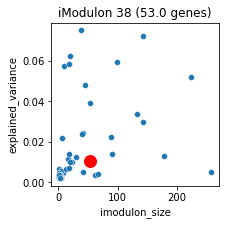

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS15150,0.163863,NaN,3384817,3385819,1,hypothetical protein,X,No COG annotation,1707,EQU24_RS15150,WP_017838693.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS15155,0.141236,NaN,3386052,3387633,1,DHA2 family efflux MFS transporter permease su...,P,Inorganic ion transport and metabolism,1708,EQU24_RS15165 // EQU24_RS15160 // EQU24_RS15155,WP_017838692.1,||None,plasma membrane\nintegral component of membran...,['plasma membrane' 'integral component of memb...
EQU24_RS11380,0.123606,NaN,2544773,2546354,1,IS66 family transposase,L,"Replication, recombination and repair",1276,EQU24_RS11380,WP_040575330.1,||None,NaN,[]
EQU24_RS22195,0.118383,NaN,390386,390539,1,hypothetical protein,X,No COG annotation,2502,EQU24_RS22195,WP_017841142.1,||None,NaN,[]
EQU24_RS20575,0.115168,NaN,4637283,4639062,-1,hypothetical protein,G,Carbohydrate transport and metabolism,2309,EQU24_RS20575,WP_017841756.1,||None,protein binding\nmembrane,['protein binding' 'membrane']
EQU24_RS01670,0.113692,NaN,352356,352530,-1,YezD family protein,X,No COG annotation,208,EQU24_RS01670,WP_014146765.1,||None,NaN,[]
EQU24_RS22390,0.111190,NaN,2602062,2602227,1,hypothetical protein,X,No COG annotation,2525,EQU24_RS22390,WP_017839339.1,||None,NaN,[]
EQU24_RS01665,0.098660,NaN,350780,352253,-1,alginate export family protein,M,Cell wall/membrane/envelope biogenesis,207,EQU24_RS01665 // EQU24_RS01660,WP_017841173.1,||None,NaN,[]
EQU24_RS01635,0.093921,NaN,344368,345238,1,EAL domain-containing protein,T,Signal transduction mechanisms,204,EQU24_RS01640 // EQU24_RS01635,WP_017841179.1,||None,NaN,[]


In [295]:
imod_info(38)

In [296]:
view_imod_weights_on_genome(ica_data,38)

alt.Chart(...)

In [297]:
ica_data.imodulon_table.loc[38,'function'] = 'membrane/transport/lowO2-fast-growth-split_EW'

## iMod 39

iModulon SG_9


alt.LayerChart(...)

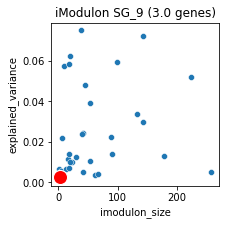

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS22355,0.520148,NaN,1865054,1865348,1,hypothetical protein,X,No COG annotation,2520,EQU24_RS22355,WP_017839903.1,||None,NaN,[]
EQU24_RS20580,0.195692,NaN,4639230,4639482,-1,pilus assembly protein,X,No COG annotation,2310,EQU24_RS20590 // EQU24_RS20585 // EQU24_RS20580,WP_201764870.1,||None,NaN,[]
EQU24_RS11380,-0.253434,NaN,2544773,2546354,1,IS66 family transposase,L,"Replication, recombination and repair",1276,EQU24_RS11380,WP_040575330.1,||None,NaN,[]


In [299]:
imod_info("SG_9")

In [303]:
#view_imod_weights_on_genome(ica_data,'SG_9')

In [301]:
ica_data.imodulon_table.loc["SG_9",'function'] = 'sg-hypothetical_EW'

## iMod 40

iModulon 40


alt.LayerChart(...)

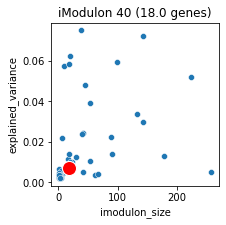

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS04315,0.270007,NaN,905154,905391,-1,DNA-binding protein,S,Function unknown,494,EQU24_RS04315 // EQU24_RS04310,WP_017840679.1,||None,"regulation of transcription, DNA-templated\nDN...","['regulation of transcription, DNA-templated' ..."
EQU24_RS12210,0.245257,NaN,2733027,2733327,1,hypothetical protein,C,Energy production and conversion,1372,EQU24_RS12210,WP_051056232.1,||None,heme binding\nmetal ion binding\nelectron tran...,['heme binding' 'metal ion binding' 'electron ...
EQU24_RS14560,0.225755,NaN,3252902,3253085,-1,CsbD family protein,X,No COG annotation,1635,EQU24_RS14560,WP_014148984.1,||None,NaN,[]
EQU24_RS00145,0.219624,NaN,34142,34445,-1,hypothetical protein,J,"Translation, ribosomal structure and biogenesis",16,EQU24_RS00155 // EQU24_RS00150 // EQU24_RS00145,WP_014146553.1,||None,NaN,[]
EQU24_RS23040,0.176668,NaN,3277868,3278099,-1,hypothetical protein,X,No COG annotation,2578,EQU24_RS23040,WP_244310888.1,||None,NaN,[]
EQU24_RS10985,0.176590,NaN,2450472,2451114,-1,DUF4255 domain-containing protein,S,Function unknown,1227,EQU24_RS10985 // EQU24_RS10980 // EQU24_RS10975,WP_017839460.1,||None,NaN,[]
EQU24_RS22905,0.175530,NaN,1352804,1353026,-1,hypothetical protein,X,No COG annotation,2567,EQU24_RS22905,WP_017840318.1,||None,NaN,[]
EQU24_RS16380,0.174186,NaN,3678261,3678483,-1,hypothetical protein,X,No COG annotation,1848,EQU24_RS16380,WP_017842548.1,||None,NaN,[]
EQU24_RS12140,0.147902,cas2,2713901,2714186,-1,CRISPR-associated endonuclease Cas2,L,"Replication, recombination and repair",1363,cas2 // cas1 // EQU24_RS12130 // cas2,WP_017839245.1,cas2||cas2,"RNA phosphodiester bond hydrolysis, endonucleo...","['RNA phosphodiester bond hydrolysis, endonucl..."


In [302]:
imod_info(40)

In [308]:
#view_imod_weights_on_genome(ica_data,40)

In [305]:
ica_data.imodulon_table.loc[40,'function'] = 'outlier-response-FM03_TR1_QC_EW'

## iMod 41

iModulon SG_10


alt.LayerChart(...)

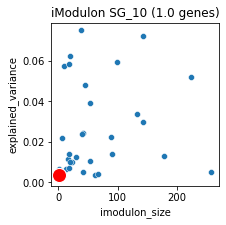

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS20580,0.372958,NaN,4639230,4639482,-1,pilus assembly protein,X,No COG annotation,2310,EQU24_RS20590 // EQU24_RS20585 // EQU24_RS20580,WP_201764870.1,||None,NaN,[]


In [307]:
imod_info("SG_10")

In [309]:
view_imod_weights_on_genome(ica_data,"SG_10")

alt.Chart(...)

In [310]:
ica_data.imodulon_table.loc["SG_10",'function'] = 'sg-pilus/up-in-Lanza_EW'

## iMod 42

iModulon 42


alt.LayerChart(...)

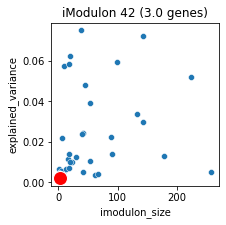

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,
EQU24_RS23040,0.515185,NaN,3277868,3278099,-1,hypothetical protein,X,No COG annotation,2578,EQU24_RS23040,WP_244310888.1,||None,NaN,[]
EQU24_RS23010,0.277635,NaN,2664686,2665580,1,IS66 family transposase,L,"Replication, recombination and repair",2574,EQU24_RS23010,WP_244310882.1,||None,NaN,[]
EQU24_RS22200,-0.194331,NaN,395600,395882,-1,hypothetical protein,X,No COG annotation,234,EQU24_RS22200 // EQU24_RS01870,WP_017841135.1,||None,NaN,[]


In [311]:
imod_info(42)

In [312]:
view_imod_weights_on_genome(ica_data,42)

alt.Chart(...)

In [314]:
ica_data.imodulon_table.loc[42,'function'] = 'unclear_EW'

# 42 is Final iMod in new run

## iMod 43

In [313]:
imod_info(43)

iModulon 43


/home/ewilson6/anaconda3/envs/modulome/lib/python3.7/site-packages/altair/utils/core.py:221: UserWarning: I don't know how to infer vegalite type from 'empty'.  Defaulting to nominal.
  "Defaulting to nominal.".format(typ)


alt.LayerChart(...)

IndexError: index 0 is out of bounds for axis 0 with size 0

In [109]:
ica_data.imodulon_table.loc[43,'function'] = 'unclear/outlier-response-FM19_TR3_QC_EW'

## iMod 44

iModulon SG_6


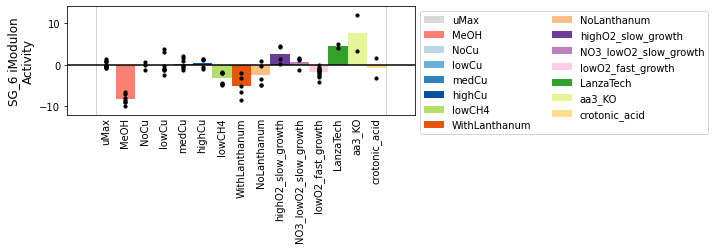

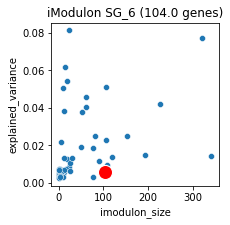

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,uniprot,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,,
EQU24_RS00030,-0.039019,NaN,7098,7257,1,DUF2283 domain-containing protein,S,Function unknown,NaN,2827,EQU24_RS00030 // EQU24_RS00025,NaN,||,NaN,[]
EQU24_RS00160,-0.039055,NaN,36419,36716,-1,hypothetical protein,X,No COG annotation,A0A4P9UIE4,2811,EQU24_RS00160,WP_017841445.1,||None,membrane,['membrane']
EQU24_RS00185,-0.053982,NaN,42145,42478,-1,hypothetical protein,L,"Replication, recombination and repair",A0A4P9UIJ4,2806,EQU24_RS00185,WP_017841440.1,||None,DNA binding\ntransposase activity\ntranspositi...,['DNA binding' 'transposase activity' 'transpo...
EQU24_RS00200,-0.045583,NaN,44158,44386,1,hypothetical protein,X,No COG annotation,NaN,2804,EQU24_RS00200,NaN,||,endonuclease activity\nnucleic acid phosphodie...,['endonuclease activity' 'nucleic acid phospho...
EQU24_RS00240,-0.043647,NaN,49350,49572,1,hypothetical protein,X,No COG annotation,NaN,2798,EQU24_RS00240,NaN,||,NaN,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EQU24_RS20770,-0.063260,NaN,4678204,4678414,-1,hypothetical protein,X,No COG annotation,NaN,190,EQU24_RS20775 // EQU24_RS20770,WP_017841721.1,||None,integral component of membrane,['integral component of membrane']
EQU24_RS20900,0.054315,NaN,4708570,4708813,-1,hypothetical protein,X,No COG annotation,A0A4P9USB7,167,EQU24_RS20900 // EQU24_RS20895,WP_017841694.1,||None,NaN,[]
EQU24_RS20950,0.037053,NaN,4717305,4718589,-1,ISKra4 family transposase,L,"Replication, recombination and repair",A0A4V1IKC4,161,EQU24_RS20950,WP_017841684.1,||None,NaN,[]


In [110]:
imod_info('SG_6')

In [111]:
ica_data.imodulon_table.loc["SG_6",'function'] = 'sg-tonB_EW'

## iMod 45

iModulon SG_7


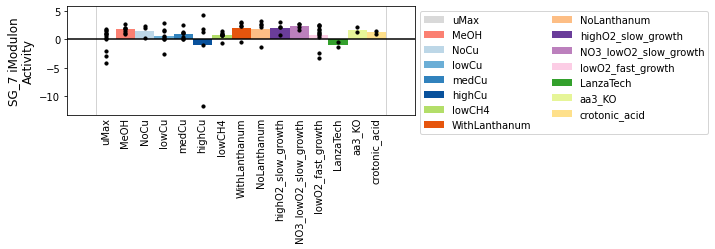

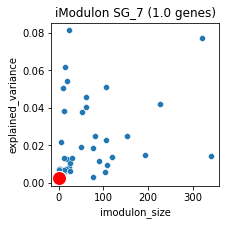

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,uniprot,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,,
EQU24_RS00175,0.468156,NaN,39992,40271,-1,hypothetical protein,L,"Replication, recombination and repair",A0A4P9UIR2,2808,EQU24_RS00175,WP_017841442.1,||None,DNA binding\ntransposase activity\ntranspositi...,['DNA binding' 'transposase activity' 'transpo...


In [112]:
imod_info("SG_7")

In [113]:
ica_data.imodulon_table.loc[45,'function'] = 'hypothetical-prot_EW'

## iMod 46

iModulon 46


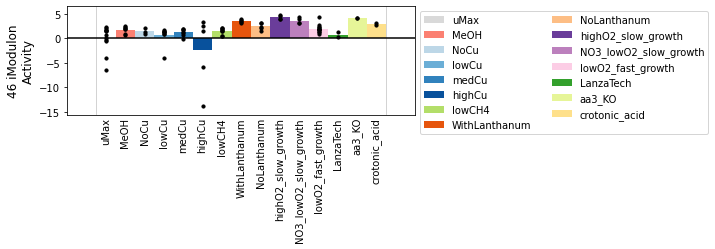

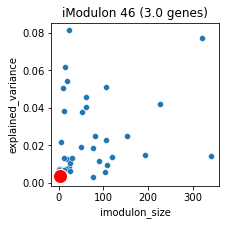

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,uniprot,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,,
EQU24_RS10965,0.338992,NaN,2446321,2446762,-1,phage tail protein,S,Function unknown,A0A4P9UN34,1458,EQU24_RS10970 // EQU24_RS10965 // EQU24_RS1096...,WP_014148651.1,||None,acyltransferase activity\nstructural molecule ...,['acyltransferase activity' 'structural molecu...
EQU24_RS16370,0.463511,NaN,3676994,3677465,-1,helix-turn-helix domain-containing protein,X,No COG annotation,A0A4P9USW1,755,EQU24_RS16370 // EQU24_RS16365,WP_017842551.1,||None,DNA binding,['DNA binding']
EQU24_RS20905,0.218347,NaN,4709465,4710749,1,ISKra4 family transposase,L,"Replication, recombination and repair",A0A4V1IKC4,166,EQU24_RS20905,WP_017841684.1,||None,NaN,[]


In [114]:
imod_info(46)

In [115]:
ica_data.imodulon_table.loc[46,'function'] = 'small-unclear_EW'

## iMod 47

iModulon 47


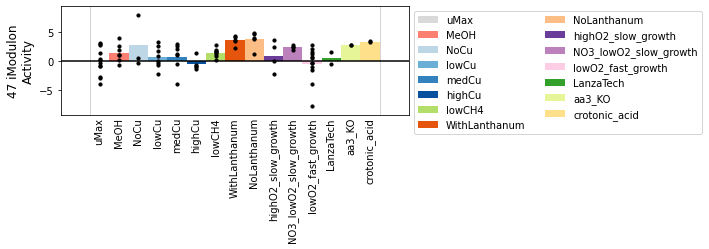

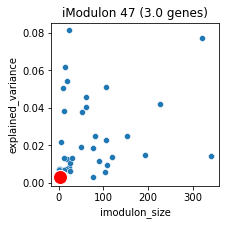

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,uniprot,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,,
EQU24_RS01150,0.233401,NaN,234038,234461,1,hypothetical protein,X,No COG annotation,A0A4P9UIU6,2671,EQU24_RS01150,WP_017841268.1,||None,NaN,[]
EQU24_RS06390,0.341700,NaN,1400455,1402006,1,IS66 family transposase,L,"Replication, recombination and repair",NaN,2023,EQU24_RS06390,WP_040575330.1,||None,NaN,[]
EQU24_RS17185,0.324562,NaN,3857027,3858578,1,IS66 family transposase,L,"Replication, recombination and repair",NaN,653,EQU24_RS17190 // EQU24_RS17185,WP_040575330.1,||None,NaN,[]


In [116]:
imod_info(47)

In [117]:
ica_data.imodulon_table.loc["SG_8",'function'] = 'small-unclear_EW'

## iMod 48


iModulon SG_8


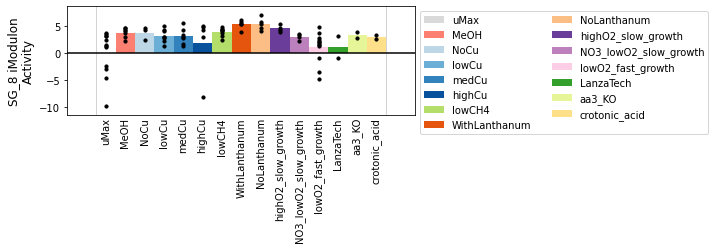

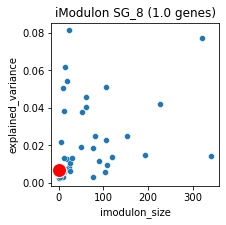

,imodulon,go_name,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,annotation,pathway_name,module_name


,gene_weight,gene_symbol,start_coord,end_coord,strand,product,COG,cog_name,uniprot,tu_id,tu_name,ncbi_protein,gene_name_extra,specific_gos_n,specific_gos
locus_tag,,,,,,,,,,,,,,,
EQU24_RS08710,0.561573,NaN,1931194,1931374,1,hypothetical protein,X,No COG annotation,NaN,1728,EQU24_RS08720 // EQU24_RS08715 // EQU24_RS08710,NaN,||,NaN,[]


In [118]:
imod_info("SG_8")

In [119]:
ica_data.imodulon_table.loc[48,'function'] = 'hypothetical-prot_EW'

# Save final ICA data object

In [321]:
data_dir

'../data/5g_processed_data'

In [322]:
save_to_json(ica_data, path.join(data_dir, '5g_curated_20221031.json.gz'))

In [323]:
ica_data.imodulon_table.to_csv(path.join(data_dir, '5g_imodulon_table_20221031.csv'))

In [324]:
ica_data.imodulon_table

,single_gene,imodulon_size,explained_variance,category,function
0,,91.0,0.014136,uncharacterized,unclear_EW
1,,41.0,0.005137,uncharacterized,upMeOH|maybe_transport?_EW
SG_1,True,62.0,0.003533,single_gene,sg-tonB_EW
3,,178.0,0.013264,uncharacterized,sulfate transport/FM23_TR3_QC-outlier-response_EW
4,,9.0,0.057266,uncharacterized,smmo_cluster_EW
5,,223.0,0.052252,uncharacterized,ribosomal/translation_EW
6,,99.0,0.059165,uncharacterized,SOS-response_EW
7,,8.0,0.004512,uncharacterized,outlier-response-FM34_T6_TR3_QC_EW
8,,20.0,0.062186,uncharacterized,cu-repression/secretion/alexey-gene-cluster_EW
SG_2,True,1.0,0.006651,single_gene,sg-ferredoxin_domain_EW


In [325]:
ica_data.imodulon_table.shape

(45, 5)